## Exploration of DNA methylation in Pgt in relation to gene expression and TEs

### Input
* 6mA methylation calls with tombo at frequency >= 0.5 in germinated spores and in infected leaves
* 5mC methylation calls with tombo at frequency >= 0.5 in germinated spores and in infected leaves
* CpG methylation calls with nanopolish and pycometh in germinated spores and in infected leaves and the comparison thereof
* gene annotation
* TE annotation
* centromer annotation
* expression at germinated spores, haustoria, 2-7 dpi
* differential expression

### Questions/hypothesis
* 6mA is positively correlated with expression.
* 5mC is negatively correlated with expression.
* differentially methylated genes are differentially expressed.
* Centromers and pericentromeric regions are hypermethylated.
* There is a difference in methylation between genes and TEs for 5mC/CpG with TEs being more heavily methylated.
* The difference in methylation between genes and TEs is less pronounces for 6mA

### Usefull tools in bedtools for analysis
* annotate potentially for multiple overlaps https://bedtools.readthedocs.io/en/latest/content/tools/annotate.html
* closest https://bedtools.readthedocs.io/en/latest/content/tools/closest.html
* cluster is a nice different way of merge without merging a bit of a grouping function https://bedtools.readthedocs.io/en/latest/content/tools/cluster.html
* complement
* coverage https://bedtools.readthedocs.io/en/latest/content/tools/coverage.html
* expand (no explanation but could be good)
* flank good for promoters and such https://bedtools.readthedocs.io/en/latest/content/tools/flank.html
* fisher https://bedtools.readthedocs.io/en/latest/content/tools/fisher.html
* genomecov for making bedgraphs and such
* getfasta
* groupby might be interesting to explore for quick summary similar to pandas groupby https://bedtools.readthedocs.io/en/latest/content/tools/groupby.html
* igv
* intersect https://bedtools.readthedocs.io/en/latest/content/tools/intersect.html
* jaccard
* makewindow
* map https://bedtools.readthedocs.io/en/latest/content/tools/map.html
* merge
* multiinter
* nuc https://bedtools.readthedocs.io/en/latest/content/tools/nuc.html
* overlap overlap or distance between two features https://bedtools.readthedocs.io/en/latest/content/tools/overlap.html
* random https://bedtools.readthedocs.io/en/latest/content/tools/random.html
* reldist to check if features more related to one feature vs. another https://bedtools.readthedocs.io/en/latest/content/tools/reldist.html
* shift does what it says https://bedtools.readthedocs.io/en/latest/content/tools/shift.html
* shuffle does what it says https://bedtools.readthedocs.io/en/latest/content/tools/shuffle.html
* slop is similar to flank but includes the initial sequence https://bedtools.readthedocs.io/en/latest/content/tools/slop.html
* sort
* substract none overlapping https://bedtools.readthedocs.io/en/latest/content/tools/subtract.html
* window allows to fish out for near feature https://bedtools.readthedocs.io/en/latest/content/tools/window.html


### Prework on the command line

#### Filter nanopolish/pycometh outputfiles on the significant column

#### Filter the differential methylation by a p-value of < 0.05

### Filter the annotation files

### Modules

In [395]:
%matplotlib inline
import pandas as pd
import os
import re
from pybedtools import BedTool
import numpy as np
import pybedtools
import re
import matplotlib.pyplot as plt
import json
import matplotlib
import subprocess
import numpy as np
import collections
import seaborn as sns
import random
from IPython.display import Image

### Input files and folders for annotations

In [2]:
genome_file_fn = os.path.abspath('../../data/genomic_resources/Pgt_genome_size.txt')
genome_assembly_fn = os.path.abspath('../../data/genomic_resources/chr_A_B_unassigned.fasta')
beddir = os.path.abspath('../../analyses/methylation_analysis/bed_files/')
outdir = os.path.abspath('../../analyses/methylation_analysis/gene_expression/')

In [255]:
annotation_dict = {}
annotation_dict['genes'] = os.path.abspath('../../analyses/methylation_analysis/bed_files/Puccinia_graminis_tritici_21-0.gene.sorted.bed')
annotation_dict['TE_family'] = os.path.abspath('../../analyses/methylation_analysis/bed_files/Pgt210_ABu.Pgt210_ABuu_denovoLibTEs.REPETnr.TE.sorted.bed')
annotation_dict['TE_superfamily'] = os.path.abspath('../../analyses/methylation_analysis/bed_files/Pgt210_ABu.Pgt210_ABuu_denovoLibTEs.REPETnr.superfamily.sorted.bed')
annotation_dict['gene_starts'] = os.path.abspath('../../analyses/methylation_analysis/bed_files/Puccinia_graminis_tritici_21-0.gene_start.sorted.bed')
annotation_dict['centromers'] = os.path.abspath('../../analyses/methylation_analysis/bed_files/Pgt210_ABu.centromers.sorted.bed')

In [4]:
!head {genome_file_fn}

chr1A	6156719
chr2A	6062785
chr3A	6034716
chr4A	5967513
chr5A	5558200
chr6A	5554679
chr7A	5184328
chr8A	5113503
chr9A	4787822
chr10A	4648557


In [5]:
###now make some useful files
##promoter
annotation_dict['promoters'] = annotation_dict['genes'].replace('.gene.', '.1kb_promoter.')
!bedtools flank -s -r 0 -l 1000 -i {annotation_dict['genes']} -g {genome_file_fn} > {annotation_dict['promoters']}

In [6]:
##promoter and genes
annotation_dict['genes_and_promoters'] = annotation_dict['genes'].replace('.gene.', '.gene_and_1kb_promoter.')
!bedtools slop -b 1000 -s -i {annotation_dict['genes']} -g {genome_file_fn} > {annotation_dict['genes_and_promoters']}

In [7]:
##starting sides
annotation_dict['start_sides'] = annotation_dict['genes'].replace('.gene.', '.300bp_startsides.')
!bedtools slop -b 300 -s -i {annotation_dict['gene_starts']} -g {genome_file_fn} > {annotation_dict['start_sides']}

In [8]:
##get genes within 1000 bases of TEs
annotation_dict['genes_close_to_TEs'] = annotation_dict['genes'].replace('.gene.', '.gene_wTE_1kb.')
!bedtools window -u -b {annotation_dict['TE_superfamily']} -a {annotation_dict['genes']} > {annotation_dict['genes_close_to_TEs']}

In [9]:
##get genes not within 1000 bases of TEs
annotation_dict['genes_close_to_TEs'] = annotation_dict['genes'].replace('.gene.', '.gene_woTE_1kb.')
!bedtools window -v  -b {annotation_dict['TE_superfamily']} -a {annotation_dict['genes']} > {annotation_dict['genes_close_to_TEs']}

### Input files for methylation

In [10]:
bed_files = !ls {beddir}

In [11]:
bed_files[:]

['DEseq2_6dpivsGerminatedSpores.csv',
 'DEseq2_7dpivsGerminatedSpores.csv',
 'differential_il_vs_gp.CpG.p0_05.CpG_agg.sorted.bed',
 'differential_il_vs_gp.CpG.p0_05.interval_1000_agg.sorted.bed',
 'germinated_spores.5mC.g05.tombo.sorted.bed',
 'germinated_spores.6mA.g05.tombo.sorted.bed',
 'germinated_spores.CpG.g2.CpG_agg.sorted.bed',
 'germinated_spores.CpG.g2.interval_1000_agg.sorted.bed',
 'infected_leaves.5mC.g05.tombo.sorted.bed',
 'infected_leaves.6mA.g05.tombo.sorted.bed',
 'infected_leaves.CpG.g2.CpG_agg.sorted.bed',
 'infected_leaves.CpG.g2.interval_1000_agg.sorted.bed',
 'Pgt210_ABu.centromers.sorted.bed',
 'Pgt210_ABu.Pgt210_ABuu_denovoLibTEs.REPETnr.superfamily.sorted.be',
 'Pgt210_ABu.Pgt210_ABuu_denovoLibTEs.REPETnr.superfamily.sorted.bed',
 'Pgt210_ABu.Pgt210_ABuu_denovoLibTEs.REPETnr.TE.sorted.bed',
 'Puccinia_graminis_tritici_21-0.1kb_promoter.sorted.bed',
 'Puccinia_graminis_tritici_21-0.300bp_startsides.sorted.bed',
 'Puccinia_graminis_tritici_21-0.gene_and_1kb_prom

In [249]:
meth_dict = {}
for file in bed_files[2:12]: #might need to changes this depending what got out
    key = file.replace('.sorted.bed', '')
    meth_dict[key] = os.path.join(beddir, file)

In [244]:
meth_dict

{'differential_il_vs_gp.CpG.p0_05.CpG_agg': '/home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/differential_il_vs_gp.CpG.p0_05.CpG_agg.sorted.bed',
 'differential_il_vs_gp.CpG.p0_05.interval_1000_agg': '/home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/differential_il_vs_gp.CpG.p0_05.interval_1000_agg.sorted.bed',
 'germinated_spores.5mC.g05.tombo': '/home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/germinated_spores.5mC.g05.tombo.sorted.bed',
 'germinated_spores.6mA.g05.tombo': '/home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/germinated_spores.6mA.g05.tombo.sorted.bed',
 'germinated_spores.CpG.g2.CpG_agg': '/home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/germinated_spores.CpG.g2.CpG_agg.sorted.bed',
 'germinated_spores.CpG.g2.interval_1000_agg': '/home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/germinated_spores.CpG.g2.interval_1000_agg.sorted.bed',
 'infected_leaves.5mC.g0

### Summaries expression data 

In [14]:
expression_dict = {}
expression_dict['Tx2'] = os.path.join(beddir, 'Tx2_Abundance_Replicates.txt')
expression_dict['Diff_6dpi'] = os.path.join(beddir, 'DEseq2_6dpivsGerminatedSpores.csv')
expression_dict['Diff_7dpi'] = os.path.join(beddir, 'DEseq2_7dpivsGerminatedSpores.csv')
exp_df = pd.read_csv(expression_dict['Tx2'], sep='\t')

In [15]:
drop_columns = exp_df.columns

In [16]:
conditions = ['HS', 'GS', 'dpi2', 'dpi3', 'dpi4', 'dpi5', 'dpi6', 'dpi7' ]

In [17]:
for cont in conditions:
    tmp_col = [x for x in exp_df.columns if cont in x]
    tmp_name = cont + '_mean'
    exp_df[tmp_name]= exp_df.loc[:, tmp_col].mean(axis=1)

In [18]:
for cont in conditions:
    tmp_col = [x for x in exp_df.columns if cont in x]
    tmp_name = cont + '_std'
    exp_df[tmp_name]= exp_df.loc[:, tmp_col].std(axis=1)

In [19]:
exp_df = exp_df.loc[:,[x for x in exp_df.columns if x not in drop_columns]]

In [20]:
exp_df.columns

Index(['HS_mean', 'GS_mean', 'dpi2_mean', 'dpi3_mean', 'dpi4_mean',
       'dpi5_mean', 'dpi6_mean', 'dpi7_mean', 'HS_std', 'GS_std', 'dpi2_std',
       'dpi3_std', 'dpi4_std', 'dpi5_std', 'dpi6_std', 'dpi7_std'],
      dtype='object')

In [21]:
exp_short_df = exp_df.loc[:, ['GS_mean', 'dpi6_mean', 'dpi7_mean']]

In [22]:
exp_short_df.head()

,GS_mean,dpi6_mean,dpi7_mean
PGT21_000001-T1,0.0,0.0,0.0
PGT21_000002-T1,0.0,0.0,0.0
PGT21_000003-T1,0.0,0.0,0.0
PGT21_000004-T1,0.0,0.0,0.0
PGT21_000005-T1,0.0,0.0,0.0


### Check if differentially methylated genes are differentially methlated

In [256]:
annotation_bed_dict = {}
for key, value in annotation_dict.items():
    annotation_bed_dict[key] = pybedtools.BedTool(value)

In [246]:
meth_bed_dict = {}
for key, value in meth_dict.items():
    meth_bed_dict[key] = pybedtools.BedTool(value)

In [25]:
meth_bed_dict.keys()

dict_keys(['differential_il_vs_gp.CpG.p0_05.CpG_agg', 'differential_il_vs_gp.CpG.p0_05.interval_1000_agg', 'germinated_spores.5mC.g05.tombo', 'germinated_spores.6mA.g05.tombo', 'germinated_spores.CpG.g2.CpG_agg', 'germinated_spores.CpG.g2.interval_1000_agg', 'infected_leaves.5mC.g05.tombo', 'infected_leaves.6mA.g05.tombo', 'infected_leaves.CpG.g2.CpG_agg', 'infected_leaves.CpG.g2.interval_1000_agg'])

In [26]:
annotation_bed_dict.keys()

dict_keys(['genes', 'TE_family', 'TE_superfamily', 'gene_starts', 'promoters', 'genes_and_promoters', 'start_sides', 'genes_close_to_TEs'])

In [27]:
###first with the CpG islands
diff_meth_gene_CpG_agg = annotation_bed_dict['genes_and_promoters'].intersect(meth_bed_dict['differential_il_vs_gp.CpG.p0_05.CpG_agg']).to_dataframe()['name']

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/differential_il_vs_gp.CpG.p0_05.CpG_agg.sorted.bed has inconsistent naming convention for record:
tig00000231	1285	1291	diff_CpG	0.010122152163899435	.

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/differential_il_vs_gp.CpG.p0_05.CpG_agg.sorted.bed has inconsistent naming convention for record:
tig00000231	1285	1291	diff_CpG	0.010122152163899435	.



In [28]:
diff_meth_gene_CpG_agg = set(diff_meth_gene_CpG_agg)

In [29]:
diff_exp_day7 = pd.read_csv(expression_dict['Diff_7dpi'], index_col=0)

In [30]:
diff_expr_7 = set([x for x in diff_exp_day7.index])

In [31]:
diff_meth_and_diff_expr_7_CpG_agg = set([x for x in diff_exp_day7.index if x in diff_meth_gene_CpG_agg])

In [32]:
###diff expressed
len(diff_expr_7)

13533

In [33]:
##both differentially expressed and methylated
len(diff_meth_and_diff_expr_7_CpG_agg)

32

In [34]:
##both differentially methylated
len(diff_meth_gene_CpG_agg)

84

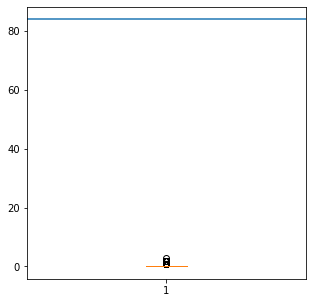

In [35]:
##check what a random overlap would be.
overlap_list = []
for x in range(0,1000):
    overlap_list.append(len(set(random.sample(diff_expr_7, len(diff_meth_gene_CpG_agg))).intersection(diff_meth_gene_CpG_agg)))
fig, ax = plt.subplots(figsize=(5,5))
ax.boxplot(overlap_list)
ax.axhline(len(diff_meth_gene_CpG_agg))

In [36]:
###now with the 1000kb windows
diff_meth_gene_window_agg = annotation_bed_dict['genes_and_promoters'].intersect(meth_bed_dict['differential_il_vs_gp.CpG.p0_05.interval_1000_agg']).to_dataframe()['name']
###first with the CpG islands
diff_meth_gene_CpG_agg = annotation_bed_dict['genes_and_promoters'].intersect(meth_bed_dict['differential_il_vs_gp.CpG.p0_05.CpG_agg']).to_dataframe()['name']

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/differential_il_vs_gp.CpG.p0_05.interval_1000_agg.sorted.bed has inconsistent naming convention for record:
tig00000231	1285	1291	diff_CpG	0.010122152163899435	.

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/differential_il_vs_gp.CpG.p0_05.interval_1000_agg.sorted.bed has inconsistent naming convention for record:
tig00000231	1285	1291	diff_CpG	0.010122152163899435	.

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/differential_il_vs_gp.CpG.p0_05.CpG_agg.sorted.bed has inconsistent naming convention for record:
tig00000231	1285	1291	diff_CpG	0.010122152163899435	.

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/differential_il_vs_gp.CpG.p0_05.CpG_agg.sorted.bed has inconsistent naming convention for record:
tig00000231	1285	1291	diff_CpG	0.010122152163899435	.



In [37]:
sum(diff_meth_gene_window_agg == diff_meth_gene_CpG_agg)

84

### Conlusions
Overall there are 82 differentially methylated genes. Of these 31 are differentially expressed at 7dpi. This is a significant overlap but the numbers are so small it is difficult to get any meaning. The low number of differentailly methylated windows might simply be because we have to little coverage at one stage and hence are lacking statistical power.

### Look at the general metylation status of repeats versus genes

In [38]:
meth_bed_dict.keys()

dict_keys(['differential_il_vs_gp.CpG.p0_05.CpG_agg', 'differential_il_vs_gp.CpG.p0_05.interval_1000_agg', 'germinated_spores.5mC.g05.tombo', 'germinated_spores.6mA.g05.tombo', 'germinated_spores.CpG.g2.CpG_agg', 'germinated_spores.CpG.g2.interval_1000_agg', 'infected_leaves.5mC.g05.tombo', 'infected_leaves.6mA.g05.tombo', 'infected_leaves.CpG.g2.CpG_agg', 'infected_leaves.CpG.g2.interval_1000_agg'])

In [39]:
exp_short_df.head()

,GS_mean,dpi6_mean,dpi7_mean
PGT21_000001-T1,0.0,0.0,0.0
PGT21_000002-T1,0.0,0.0,0.0
PGT21_000003-T1,0.0,0.0,0.0
PGT21_000004-T1,0.0,0.0,0.0
PGT21_000005-T1,0.0,0.0,0.0


In [40]:
###the annotation coverage methylation overlap and attach it to the expression dataframe
for anno in ['genes', 'promoters','genes_and_promoters','start_sides']:
    for key in meth_bed_dict.keys():
        if not key.startswith('differential'):
            tmp_df = annotation_bed_dict[anno].coverage(meth_bed_dict[key]).to_dataframe().loc[:, ['name', 'blockCount']]
            tmp_df.index =  tmp_df.name
            tmp_df.drop('name', axis=1, inplace=True)
            tmp_df.rename(columns={'blockCount': anno+'_'+key}, inplace=True)
            exp_short_df = exp_short_df.merge(tmp_df, right_index=True, left_index=True)

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/germinated_spores.5mC.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	13219	13220	5mC	0.5	+

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/germinated_spores.5mC.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	13219	13220	5mC	0.5	+

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/germinated_spores.6mA.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	15640	15641	6mA	0.5	-

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/germinated_spores.6mA.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	15640	15641	6mA	0.5	-

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/germinated_spores.CpG.g2.CpG_agg.sorted.bed has inconsistent

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/germinated_spores.CpG.g2.interval_1000_agg.sorted.bed has inconsistent naming convention for record:
tig00000130	23000	24000	.	2.383	.	23000	24000	252,118,53

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/germinated_spores.CpG.g2.interval_1000_agg.sorted.bed has inconsistent naming convention for record:
tig00000130	23000	24000	.	2.383	.	23000	24000	252,118,53

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/infected_leaves.5mC.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	13853	13854	5mC	0.5	-

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/infected_leaves.5mC.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	13853	13854	5mC	0.5	-

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_fi

In [41]:
exp_short_df.head()

,GS_mean,dpi6_mean,dpi7_mean,genes_germinated_spores.5mC.g05.tombo,genes_germinated_spores.6mA.g05.tombo,genes_germinated_spores.CpG.g2.CpG_agg,genes_germinated_spores.CpG.g2.interval_1000_agg,genes_infected_leaves.5mC.g05.tombo,genes_infected_leaves.6mA.g05.tombo,genes_infected_leaves.CpG.g2.CpG_agg,...,genes_and_promoters_infected_leaves.CpG.g2.CpG_agg,genes_and_promoters_infected_leaves.CpG.g2.interval_1000_agg,start_sides_germinated_spores.5mC.g05.tombo,start_sides_germinated_spores.6mA.g05.tombo,start_sides_germinated_spores.CpG.g2.CpG_agg,start_sides_germinated_spores.CpG.g2.interval_1000_agg,start_sides_infected_leaves.5mC.g05.tombo,start_sides_infected_leaves.6mA.g05.tombo,start_sides_infected_leaves.CpG.g2.CpG_agg,start_sides_infected_leaves.CpG.g2.interval_1000_agg
PGT21_000001-T1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PGT21_000002-T1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PGT21_000003-T1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PGT21_000004-T1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PGT21_000005-T1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [312]:
def correlation_and_plot_wtype(selection, cor_type):
    meth_correlation = pd.DataFrame.corr(exp_short_df.loc[:,selection], cor_type)
    fig , ax = plt.subplots(figsize=(10,10))
    
    im = ax.pcolor(meth_correlation)
    #print(len(meth_correlation.index))
    ax.set_xticks(np.arange(len(meth_correlation.index)) +0.5)
    ax.set_yticks(np.arange(len(meth_correlation.index)) +0.5)
    ax.set_xticklabels(meth_correlation.index, rotation=90)
    ax.set_yticklabels(meth_correlation.index)
    
    fig.colorbar(im )
    return meth_correlation

,log10_dpi7_mean,genes_infected_leaves.5mC.g05.tombo,genes_infected_leaves.6mA.g05.tombo,genes_infected_leaves.CpG.g2.CpG_agg,genes_infected_leaves.CpG.g2.interval_1000_agg
log10_dpi7_mean,1.000000,-0.202497,-0.051766,-0.244137,-0.232568
genes_infected_leaves.5mC.g05.tombo,-0.202497,1.000000,0.361095,0.393537,0.343670
genes_infected_leaves.6mA.g05.tombo,-0.051766,0.361095,1.000000,0.310295,0.253421
genes_infected_leaves.CpG.g2.CpG_agg,-0.244137,0.393537,0.310295,1.000000,0.683500
genes_infected_leaves.CpG.g2.interval_1000_agg,-0.232568,0.343670,0.253421,0.683500,1.000000


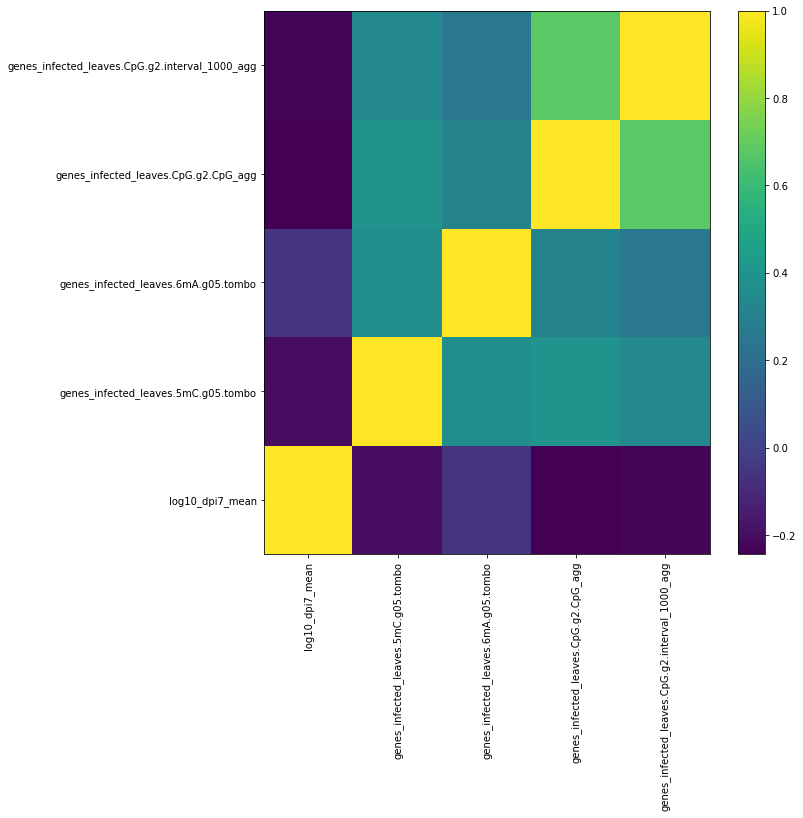

In [316]:
selection = ['log10_dpi7_mean'] + [x for x in exp_short_df.columns if x.startswith('genes') and not\
                                 x.startswith('genes_and') and 'infected_leaves' in x]
correlation_and_plot_wtype(selection, 'kendall')

,log10_GS_mean,genes_germinated_spores.5mC.g05.tombo,genes_germinated_spores.6mA.g05.tombo,genes_germinated_spores.CpG.g2.CpG_agg,genes_germinated_spores.CpG.g2.interval_1000_agg
log10_GS_mean,1.000000,-0.216010,-0.076757,-0.254431,-0.252372
genes_germinated_spores.5mC.g05.tombo,-0.216010,1.000000,0.393942,0.384717,0.352095
genes_germinated_spores.6mA.g05.tombo,-0.076757,0.393942,1.000000,0.324979,0.280645
genes_germinated_spores.CpG.g2.CpG_agg,-0.254431,0.384717,0.324979,1.000000,0.725890
genes_germinated_spores.CpG.g2.interval_1000_agg,-0.252372,0.352095,0.280645,0.725890,1.000000


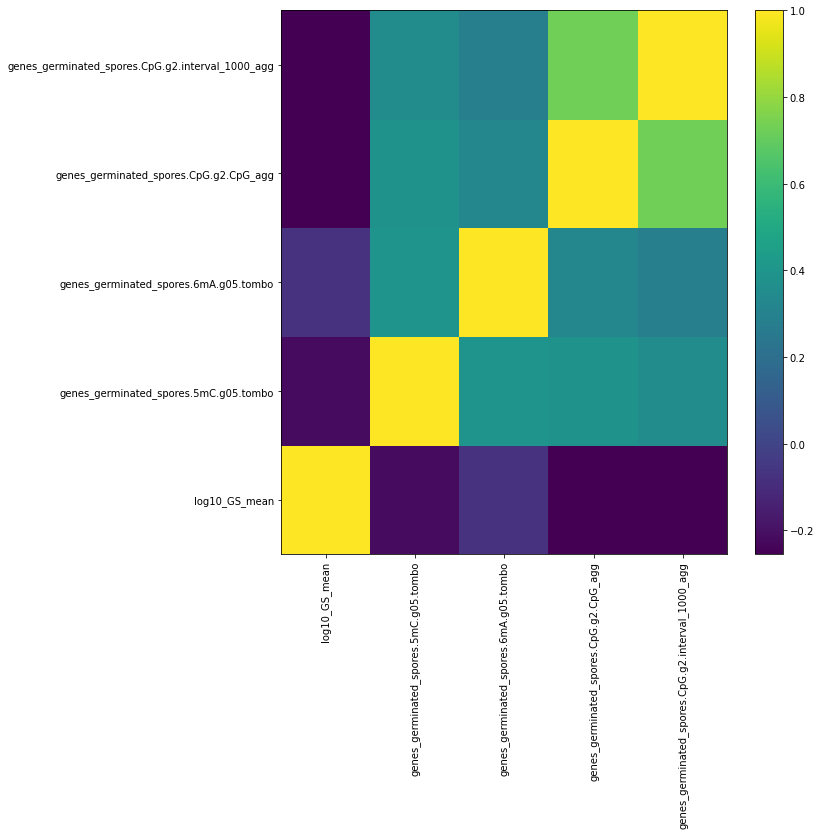

In [302]:
selection = ['log10_GS_mean'] + [x for x in exp_short_df.columns if x.startswith('genes') and not\
                                 x.startswith('genes_and') and 'germinated_spores' in x]
correlation_and_plot_wtype(selection, 'kendall')

In [402]:
def correlation_and_plot(selection, fn = None):
    meth_correlation = pd.DataFrame.corr(exp_short_df.loc[:,selection])
    fig , ax = plt.subplots(figsize=(15,15))
    
    im = ax.pcolor(meth_correlation)
    #print(len(meth_correlation.index))
    ax.set_xticks(np.arange(len(meth_correlation.index)) +0.5)
    ax.set_yticks(np.arange(len(meth_correlation.index)) +0.5)
    ax.set_xticklabels(meth_correlation.index, rotation=90)
    ax.set_yticklabels(meth_correlation.index)
    cbar = fig.colorbar(im, ticks = [x/10 for x in range(1, 11, 1)])
    cbar.set_label(label='Correlation',size=25,weight='bold')
    ticklabs = cbar.ax.get_yticklabels()
    print(ticklabs)
    for t in ticklabs:
        t.set_fontsize(20)
    if fn:
        pass
        fig.savefig(out_fn, bbox_inches='tight', dpi=600)
        
    
    return meth_correlation

In [337]:
selection = [x for x in exp_short_df.columns if x.startswith('genes') and not x.startswith('genes_and')]
selection

['genes_germinated_spores.5mC.g05.tombo',
 'genes_germinated_spores.6mA.g05.tombo',
 'genes_germinated_spores.CpG.g2.CpG_agg',
 'genes_germinated_spores.CpG.g2.interval_1000_agg',
 'genes_infected_leaves.5mC.g05.tombo',
 'genes_infected_leaves.6mA.g05.tombo',
 'genes_infected_leaves.CpG.g2.CpG_agg',
 'genes_infected_leaves.CpG.g2.interval_1000_agg']

In [392]:
selection = ['genes_germinated_spores.5mC.g05.tombo',
 'genes_germinated_spores.6mA.g05.tombo',

 'genes_germinated_spores.CpG.g2.interval_1000_agg',
 'genes_infected_leaves.5mC.g05.tombo',
 'genes_infected_leaves.6mA.g05.tombo',

 'genes_infected_leaves.CpG.g2.interval_1000_agg']
out_fn = os.path.join(outdir, 'Correlation_matrix_5mA_and_6mC.png')

In [393]:
print(out_fn)

/home/jamila/jamila_Storage/analyses/methylation_analysis/gene_expression/Correlation_matrix_5mA_and_6mC.png


<a list of 10 Text major ticklabel objects>


,genes_germinated_spores.5mC.g05.tombo,genes_germinated_spores.6mA.g05.tombo,genes_germinated_spores.CpG.g2.interval_1000_agg,genes_infected_leaves.5mC.g05.tombo,genes_infected_leaves.6mA.g05.tombo,genes_infected_leaves.CpG.g2.interval_1000_agg
genes_germinated_spores.5mC.g05.tombo,1.000000,0.495438,0.592367,0.738913,0.279051,0.447984
genes_germinated_spores.6mA.g05.tombo,0.495438,1.000000,0.367994,0.278208,0.333437,0.162936
genes_germinated_spores.CpG.g2.interval_1000_agg,0.592367,0.367994,1.000000,0.424210,0.165927,0.375502
genes_infected_leaves.5mC.g05.tombo,0.738913,0.278208,0.424210,1.000000,0.477991,0.577389
genes_infected_leaves.6mA.g05.tombo,0.279051,0.333437,0.165927,0.477991,1.000000,0.324833
genes_infected_leaves.CpG.g2.interval_1000_agg,0.447984,0.162936,0.375502,0.577389,0.324833,1.000000


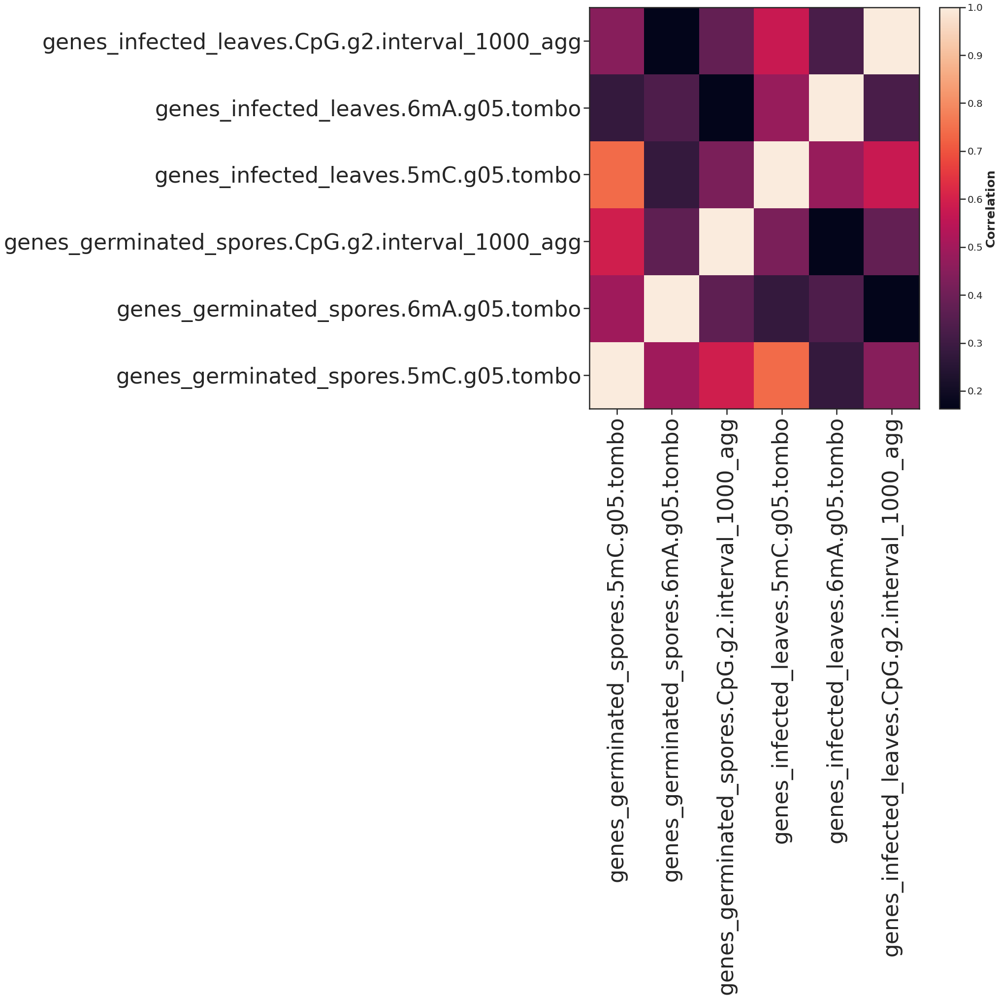

In [403]:
correlation_and_plot(selection, out_fn)

In [404]:
Image(out_fn)

In [77]:
exp_short_df.columns

Index(['GS_mean', 'dpi6_mean', 'dpi7_mean',
       'genes_germinated_spores.5mC.g05.tombo',
       'genes_germinated_spores.6mA.g05.tombo',
       'genes_germinated_spores.CpG.g2.CpG_agg',
       'genes_germinated_spores.CpG.g2.interval_1000_agg',
       'genes_infected_leaves.5mC.g05.tombo',
       'genes_infected_leaves.6mA.g05.tombo',
       'genes_infected_leaves.CpG.g2.CpG_agg',
       'genes_infected_leaves.CpG.g2.interval_1000_agg',
       'promoters_germinated_spores.5mC.g05.tombo',
       'promoters_germinated_spores.6mA.g05.tombo',
       'promoters_germinated_spores.CpG.g2.CpG_agg',
       'promoters_germinated_spores.CpG.g2.interval_1000_agg',
       'promoters_infected_leaves.5mC.g05.tombo',
       'promoters_infected_leaves.6mA.g05.tombo',
       'promoters_infected_leaves.CpG.g2.CpG_agg',
       'promoters_infected_leaves.CpG.g2.interval_1000_agg',
       'genes_and_promoters_germinated_spores.5mC.g05.tombo',
       'genes_and_promoters_germinated_spores.6mA.g05.tombo',


,GS_mean,dpi7_mean,genes_germinated_spores.5mC.g05.tombo,genes_germinated_spores.6mA.g05.tombo,genes_germinated_spores.CpG.g2.CpG_agg,genes_germinated_spores.CpG.g2.interval_1000_agg,genes_infected_leaves.5mC.g05.tombo,genes_infected_leaves.6mA.g05.tombo,genes_infected_leaves.CpG.g2.CpG_agg,genes_infected_leaves.CpG.g2.interval_1000_agg
GS_mean,1.000000,0.027979,-0.013448,-0.004071,-0.009638,-0.011977,-0.011864,-0.006736,-0.009756,-0.011606
dpi7_mean,0.027979,1.000000,-0.028163,-0.007066,-0.018744,-0.023247,-0.024646,-0.008609,-0.019964,-0.023229
genes_germinated_spores.5mC.g05.tombo,-0.013448,-0.028163,1.000000,0.495438,0.671439,0.592367,0.738913,0.279051,0.513823,0.447984
genes_germinated_spores.6mA.g05.tombo,-0.004071,-0.007066,0.495438,1.000000,0.361209,0.367994,0.278208,0.333437,0.183392,0.162936
genes_germinated_spores.CpG.g2.CpG_agg,-0.009638,-0.018744,0.671439,0.361209,1.000000,0.686261,0.488840,0.173284,0.424804,0.292545
genes_germinated_spores.CpG.g2.interval_1000_agg,-0.011977,-0.023247,0.592367,0.367994,0.686261,1.000000,0.424210,0.165927,0.293141,0.375502
genes_infected_leaves.5mC.g05.tombo,-0.011864,-0.024646,0.738913,0.278208,0.488840,0.424210,1.000000,0.477991,0.673370,0.577389
genes_infected_leaves.6mA.g05.tombo,-0.006736,-0.008609,0.279051,0.333437,0.173284,0.165927,0.477991,1.000000,0.345240,0.324833
genes_infected_leaves.CpG.g2.CpG_agg,-0.009756,-0.019964,0.513823,0.183392,0.424804,0.293141,0.673370,0.345240,1.000000,0.658952
genes_infected_leaves.CpG.g2.interval_1000_agg,-0.011606,-0.023229,0.447984,0.162936,0.292545,0.375502,0.577389,0.324833,0.658952,1.000000


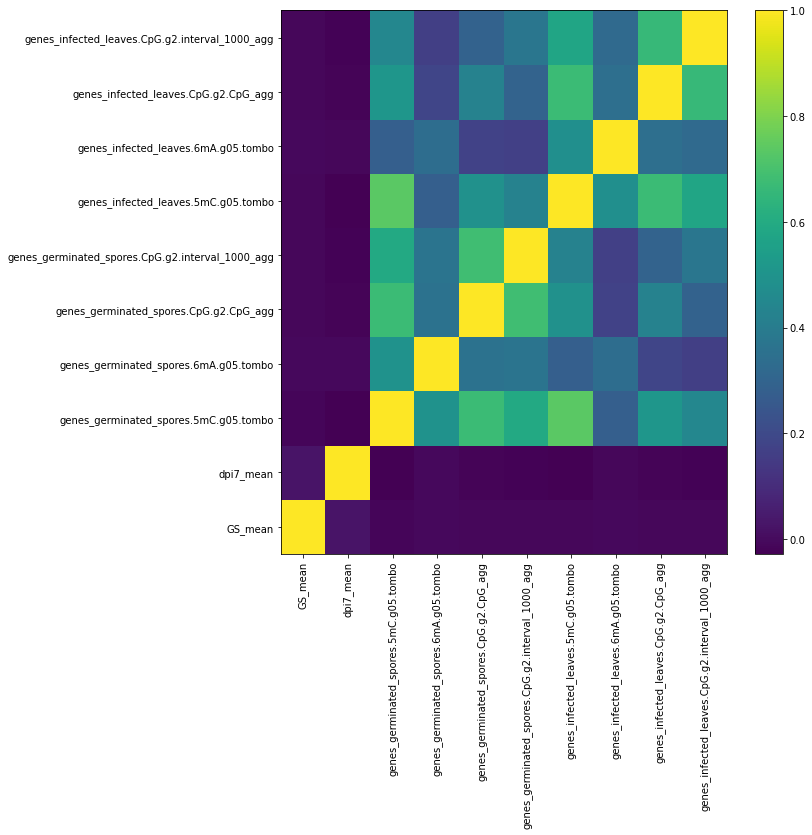

In [289]:
selection = ['GS_mean', 'dpi7_mean'] + [x for x in exp_short_df.columns if x.startswith('genes') and not x.startswith('genes_and')]
correlation_and_plot(selection)

,GS_mean,dpi7_mean,genes_and_promoters_germinated_spores.5mC.g05.tombo,genes_and_promoters_germinated_spores.6mA.g05.tombo,genes_and_promoters_germinated_spores.CpG.g2.CpG_agg,genes_and_promoters_germinated_spores.CpG.g2.interval_1000_agg,genes_and_promoters_infected_leaves.5mC.g05.tombo,genes_and_promoters_infected_leaves.6mA.g05.tombo,genes_and_promoters_infected_leaves.CpG.g2.CpG_agg,genes_and_promoters_infected_leaves.CpG.g2.interval_1000_agg
GS_mean,1.000000,0.027979,-0.012126,-0.004975,-0.011559,-0.013516,-0.014144,-0.009798,-0.011932,-0.013236
dpi7_mean,0.027979,1.000000,-0.027912,-0.012435,-0.021365,-0.025273,-0.026891,-0.007770,-0.023141,-0.025639
genes_and_promoters_germinated_spores.5mC.g05.tombo,-0.012126,-0.027912,1.000000,0.597783,0.713008,0.645141,0.718706,0.315165,0.534293,0.478697
genes_and_promoters_germinated_spores.6mA.g05.tombo,-0.004975,-0.012435,0.597783,1.000000,0.442096,0.442136,0.304104,0.337339,0.203710,0.187266
genes_and_promoters_germinated_spores.CpG.g2.CpG_agg,-0.011559,-0.021365,0.713008,0.442096,1.000000,0.795441,0.495711,0.199627,0.419430,0.344557
genes_and_promoters_germinated_spores.CpG.g2.interval_1000_agg,-0.013516,-0.025273,0.645141,0.442136,0.795441,1.000000,0.444362,0.193441,0.345943,0.406600
genes_and_promoters_infected_leaves.5mC.g05.tombo,-0.014144,-0.026891,0.718706,0.304104,0.495711,0.444362,1.000000,0.587137,0.729512,0.633752
genes_and_promoters_infected_leaves.6mA.g05.tombo,-0.009798,-0.007770,0.315165,0.337339,0.199627,0.193441,0.587137,1.000000,0.437248,0.398588
genes_and_promoters_infected_leaves.CpG.g2.CpG_agg,-0.011932,-0.023141,0.534293,0.203710,0.419430,0.345943,0.729512,0.437248,1.000000,0.763189
genes_and_promoters_infected_leaves.CpG.g2.interval_1000_agg,-0.013236,-0.025639,0.478697,0.187266,0.344557,0.406600,0.633752,0.398588,0.763189,1.000000


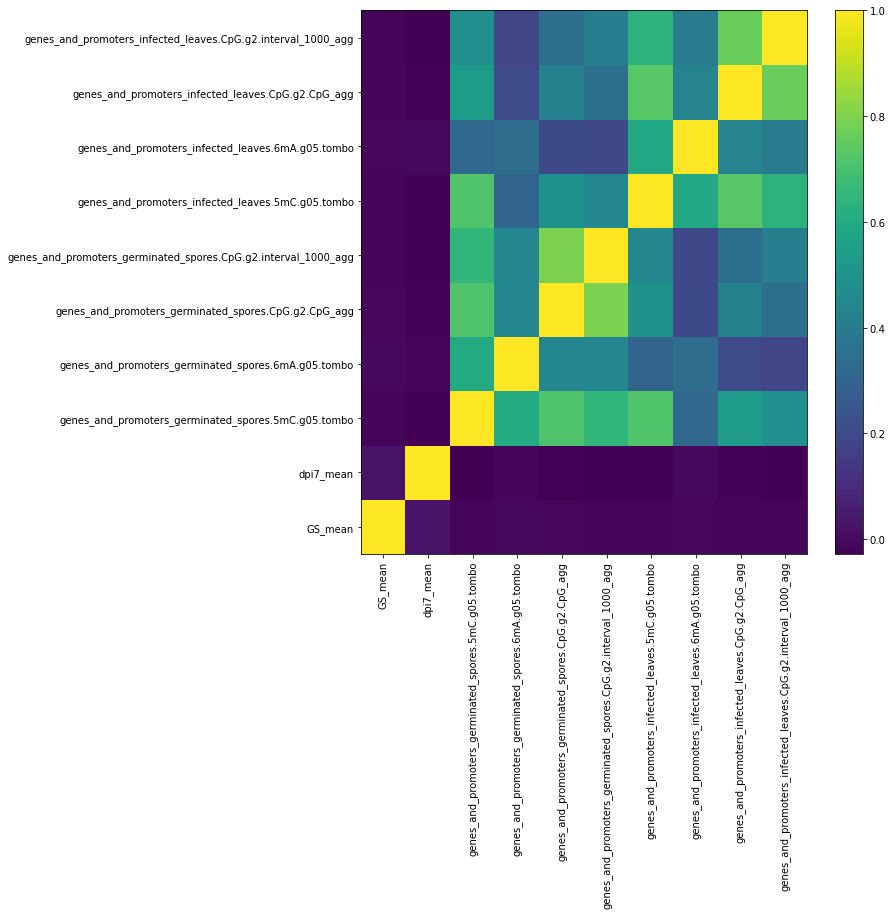

In [290]:
selection = ['GS_mean', 'dpi7_mean'] + [x for x in exp_short_df.columns if x.startswith('genes_and')]
correlation_and_plot(selection)

,genes_and_promoters_germinated_spores.5mC.g05.tombo,genes_and_promoters_germinated_spores.6mA.g05.tombo,genes_and_promoters_germinated_spores.CpG.g2.CpG_agg,genes_and_promoters_germinated_spores.CpG.g2.interval_1000_agg,genes_and_promoters_infected_leaves.5mC.g05.tombo,genes_and_promoters_infected_leaves.6mA.g05.tombo,genes_and_promoters_infected_leaves.CpG.g2.CpG_agg,genes_and_promoters_infected_leaves.CpG.g2.interval_1000_agg
genes_and_promoters_germinated_spores.5mC.g05.tombo,1.000000,0.597783,0.713008,0.645141,0.718706,0.315165,0.534293,0.478697
genes_and_promoters_germinated_spores.6mA.g05.tombo,0.597783,1.000000,0.442096,0.442136,0.304104,0.337339,0.203710,0.187266
genes_and_promoters_germinated_spores.CpG.g2.CpG_agg,0.713008,0.442096,1.000000,0.795441,0.495711,0.199627,0.419430,0.344557
genes_and_promoters_germinated_spores.CpG.g2.interval_1000_agg,0.645141,0.442136,0.795441,1.000000,0.444362,0.193441,0.345943,0.406600
genes_and_promoters_infected_leaves.5mC.g05.tombo,0.718706,0.304104,0.495711,0.444362,1.000000,0.587137,0.729512,0.633752
genes_and_promoters_infected_leaves.6mA.g05.tombo,0.315165,0.337339,0.199627,0.193441,0.587137,1.000000,0.437248,0.398588
genes_and_promoters_infected_leaves.CpG.g2.CpG_agg,0.534293,0.203710,0.419430,0.345943,0.729512,0.437248,1.000000,0.763189
genes_and_promoters_infected_leaves.CpG.g2.interval_1000_agg,0.478697,0.187266,0.344557,0.406600,0.633752,0.398588,0.763189,1.000000


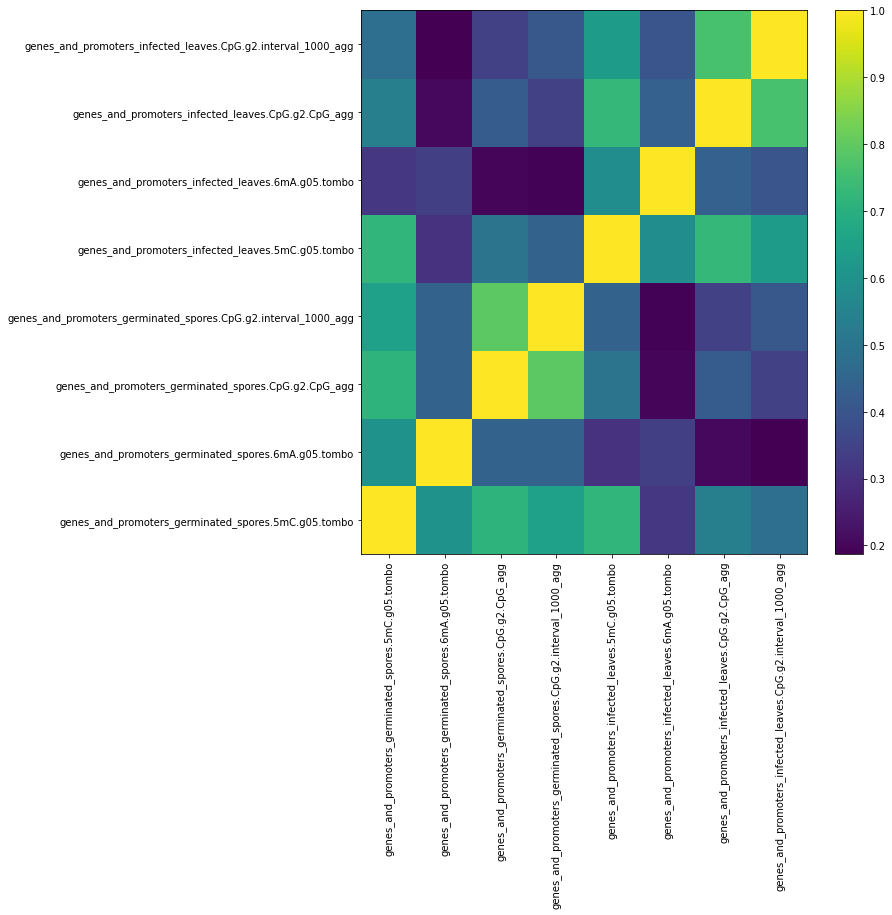

In [293]:
selection = [x for x in exp_short_df.columns if x.startswith('genes_and')]
correlation_and_plot(selection)

,start_sides_germinated_spores.5mC.g05.tombo,start_sides_germinated_spores.6mA.g05.tombo,start_sides_germinated_spores.CpG.g2.CpG_agg,start_sides_germinated_spores.CpG.g2.interval_1000_agg,start_sides_infected_leaves.5mC.g05.tombo,start_sides_infected_leaves.6mA.g05.tombo,start_sides_infected_leaves.CpG.g2.CpG_agg,start_sides_infected_leaves.CpG.g2.interval_1000_agg
start_sides_germinated_spores.5mC.g05.tombo,1.000000,0.431090,0.634864,0.531284,0.680885,0.225199,0.480802,0.390011
start_sides_germinated_spores.6mA.g05.tombo,0.431090,1.000000,0.305875,0.300961,0.228984,0.356851,0.150719,0.132591
start_sides_germinated_spores.CpG.g2.CpG_agg,0.634864,0.305875,1.000000,0.647898,0.448950,0.143067,0.405466,0.269082
start_sides_germinated_spores.CpG.g2.interval_1000_agg,0.531284,0.300961,0.647898,1.000000,0.362631,0.127360,0.269456,0.345660
start_sides_infected_leaves.5mC.g05.tombo,0.680885,0.228984,0.448950,0.362631,1.000000,0.417212,0.635503,0.504599
start_sides_infected_leaves.6mA.g05.tombo,0.225199,0.356851,0.143067,0.127360,0.417212,1.000000,0.302062,0.272107
start_sides_infected_leaves.CpG.g2.CpG_agg,0.480802,0.150719,0.405466,0.269456,0.635503,0.302062,1.000000,0.616348
start_sides_infected_leaves.CpG.g2.interval_1000_agg,0.390011,0.132591,0.269082,0.345660,0.504599,0.272107,0.616348,1.000000


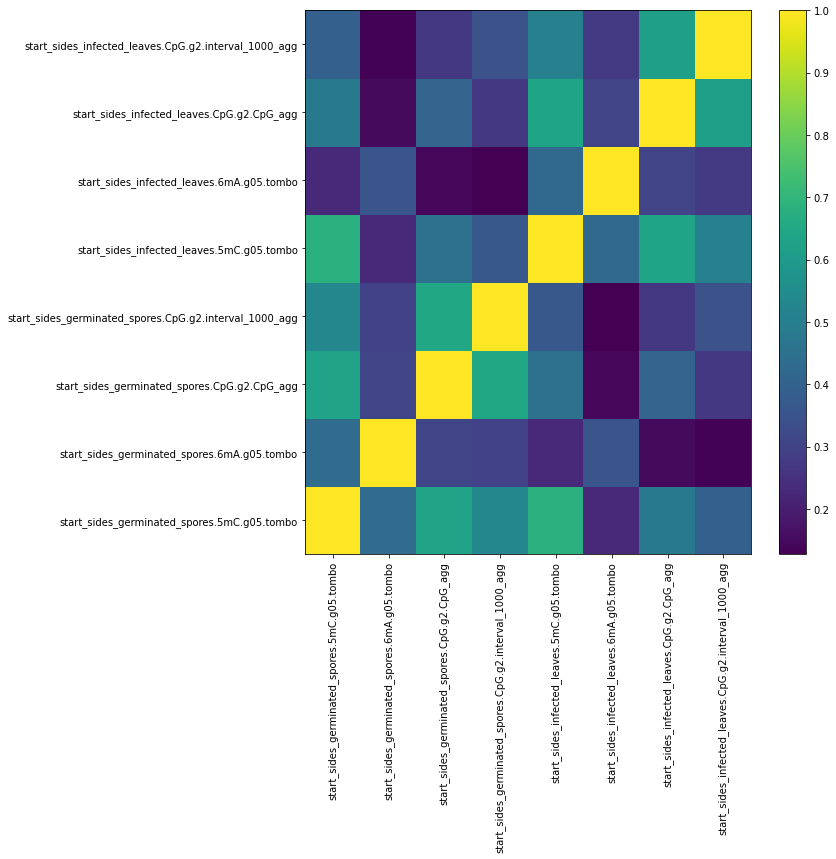

In [291]:
selection = [x for x in exp_short_df.columns if x.startswith('start_sides_')]
correlation_and_plot(selection)

,genes_and_promoters_infected_leaves.5mC.g05.tombo,genes_and_promoters_infected_leaves.6mA.g05.tombo,genes_and_promoters_infected_leaves.CpG.g2.CpG_agg,genes_and_promoters_infected_leaves.CpG.g2.interval_1000_agg
genes_and_promoters_infected_leaves.5mC.g05.tombo,1.000000,0.587137,0.729512,0.633752
genes_and_promoters_infected_leaves.6mA.g05.tombo,0.587137,1.000000,0.437248,0.398588
genes_and_promoters_infected_leaves.CpG.g2.CpG_agg,0.729512,0.437248,1.000000,0.763189
genes_and_promoters_infected_leaves.CpG.g2.interval_1000_agg,0.633752,0.398588,0.763189,1.000000


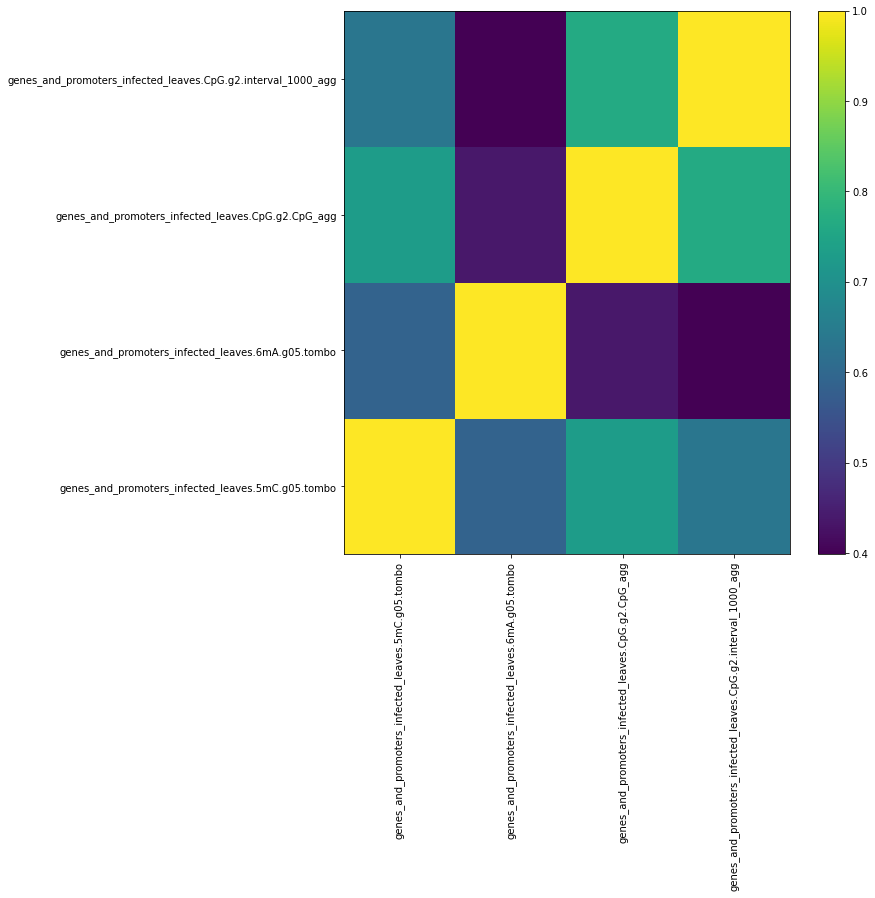

In [292]:
selection = [x for x in exp_short_df.columns if x.startswith('genes_and_promoters_infected_leaves')]
correlation_and_plot(selection)

Check if methylation is switched either for CpG infected leaves or tomobo germinated spores

### Look at expression data

In [108]:
exp_short_df['log10_GS_mean'] = np.log10(exp_short_df['GS_mean'] +1)
exp_short_df['log10_dpi6_mean'] = np.log10(exp_short_df['dpi6_mean'] +1)
exp_short_df['log10_dpi7_mean'] = np.log10(exp_short_df['dpi7_mean'] +1)

In [405]:
def plot_boxplot_gene_expression(meth, express, cutoff):
    sns.set_context("poster", font_scale=2)
    tmp_df = exp_short_df.copy()
    tmp_df['Methylation'] = "low"
    index = tmp_df[tmp_df[meth] > cutoff].index
    tmp_df.loc[index,'Methylation'] = 'high'
    fig , ax = plt.subplots(figsize=(10,10))
    sns.violinplot(x='Methylation', y=express, data=tmp_df, ax=ax, cut=0)
    plt.title(meth)
    out_fn = os.path.join(outdir, meth + '.png')
    fig.savefig(out_fn, bbox_inches='tight', dpi=600)
    return fig

In [406]:
expressions = ['log10_GS_mean',
       'log10_dpi6_mean', 'log10_dpi7_mean']

In [407]:
germinated_contidions = ['genes_germinated_spores.5mC.g05.tombo',
       'genes_germinated_spores.6mA.g05.tombo',
       'genes_germinated_spores.CpG.g2.CpG_agg',
       'genes_germinated_spores.CpG.g2.interval_1000_agg', 'promoters_germinated_spores.5mC.g05.tombo',
       'promoters_germinated_spores.6mA.g05.tombo',
       'promoters_germinated_spores.CpG.g2.CpG_agg',
       'promoters_germinated_spores.CpG.g2.interval_1000_agg',
                        'genes_and_promoters_germinated_spores.5mC.g05.tombo',
       'genes_and_promoters_germinated_spores.6mA.g05.tombo',
       'genes_and_promoters_germinated_spores.CpG.g2.CpG_agg',
       'genes_and_promoters_germinated_spores.CpG.g2.interval_1000_agg',
                        'start_sides_germinated_spores.5mC.g05.tombo',
       'start_sides_germinated_spores.6mA.g05.tombo',
       'start_sides_germinated_spores.CpG.g2.CpG_agg',
       'start_sides_germinated_spores.CpG.g2.interval_1000_agg']

In [408]:
infected_contidions = ['genes_infected_leaves.5mC.g05.tombo',
       'genes_infected_leaves.6mA.g05.tombo',
       'genes_infected_leaves.CpG.g2.CpG_agg',
       'genes_infected_leaves.CpG.g2.interval_1000_agg',
                    'promoters_infected_leaves.5mC.g05.tombo',
       'promoters_infected_leaves.6mA.g05.tombo',
       'promoters_infected_leaves.CpG.g2.CpG_agg',
       'promoters_infected_leaves.CpG.g2.interval_1000_agg' ,
                      'genes_and_promoters_infected_leaves.5mC.g05.tombo',
       'genes_and_promoters_infected_leaves.6mA.g05.tombo',
       'genes_and_promoters_infected_leaves.CpG.g2.CpG_agg',
       'genes_and_promoters_infected_leaves.CpG.g2.interval_1000_agg','start_sides_infected_leaves.5mC.g05.tombo',
       'start_sides_infected_leaves.6mA.g05.tombo',
       'start_sides_infected_leaves.CpG.g2.CpG_agg',
       'start_sides_infected_leaves.CpG.g2.interval_1000_agg']

In [409]:
[expressions[0]]*len(germinated_contidions)

['log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean',
 'log10_GS_mean']

In [410]:
font = {'family': 'serif',
        'color':  'darkred',
        'weight': 'normal',
        'size': 16,
        }


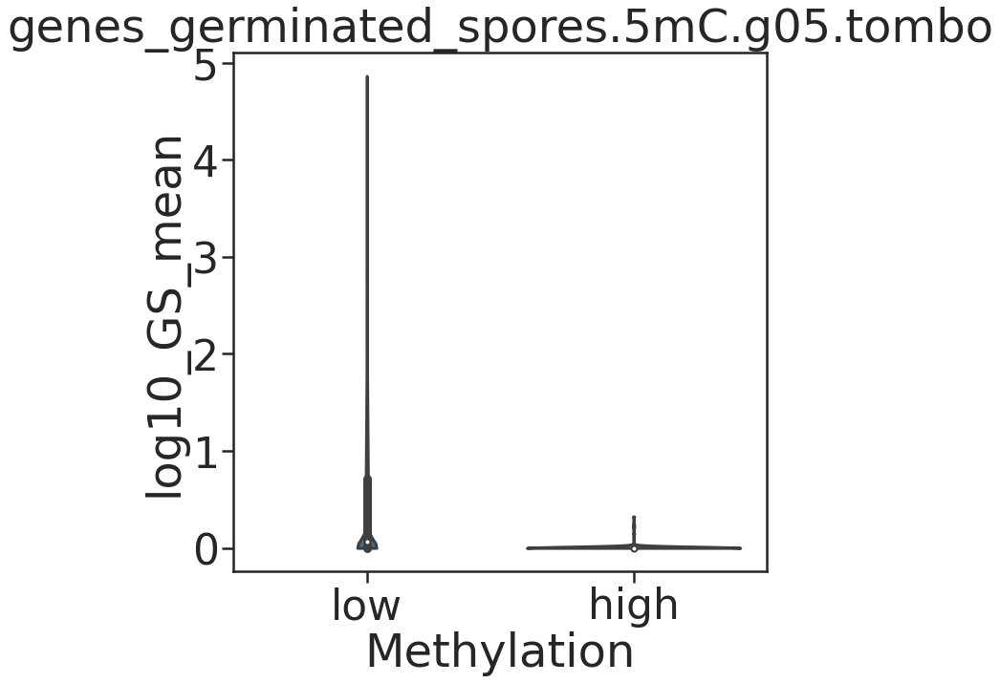

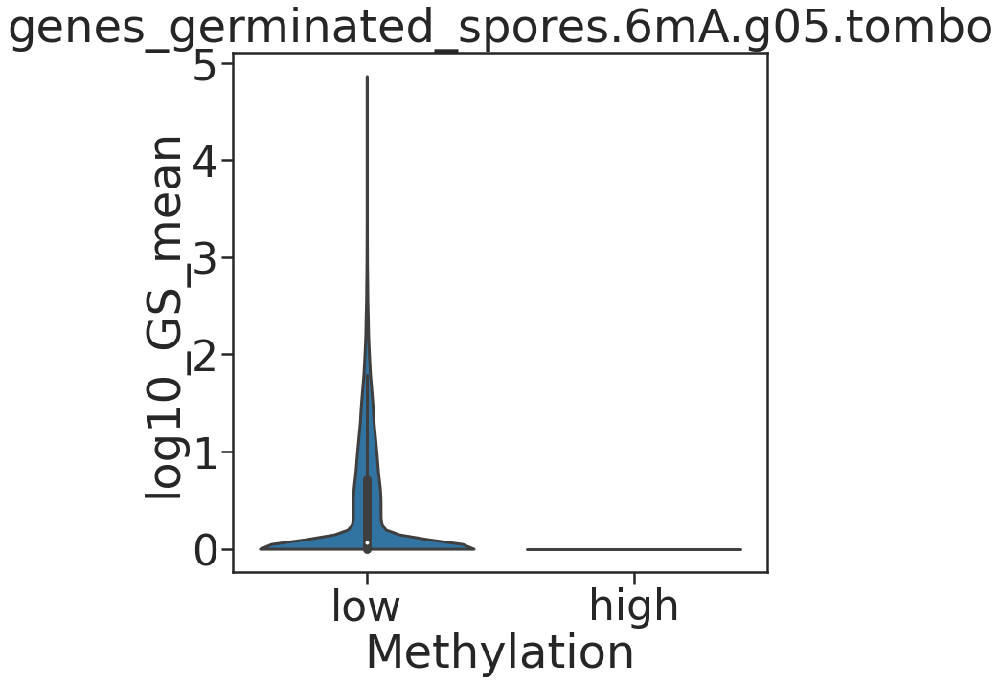

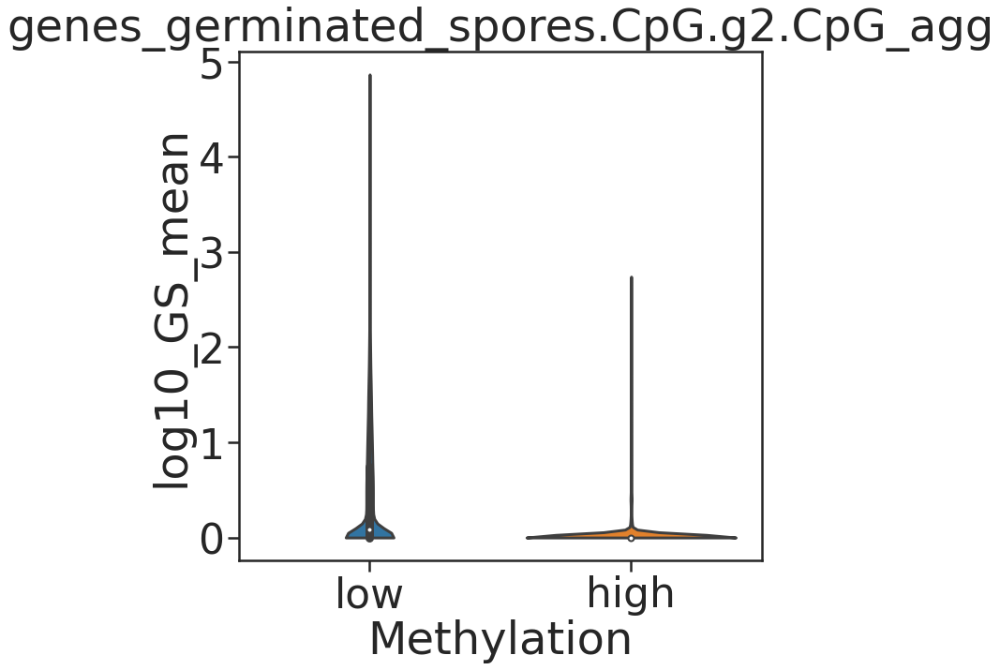

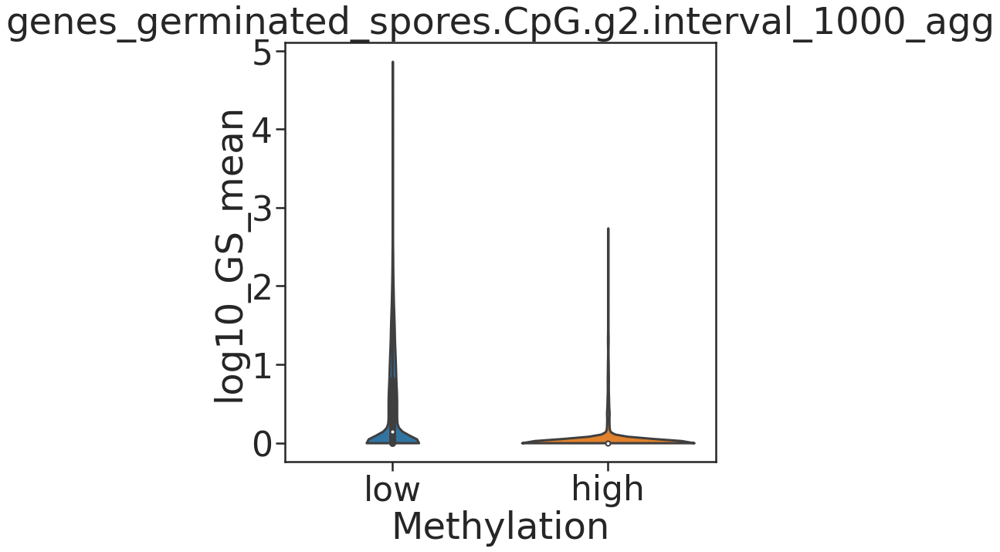

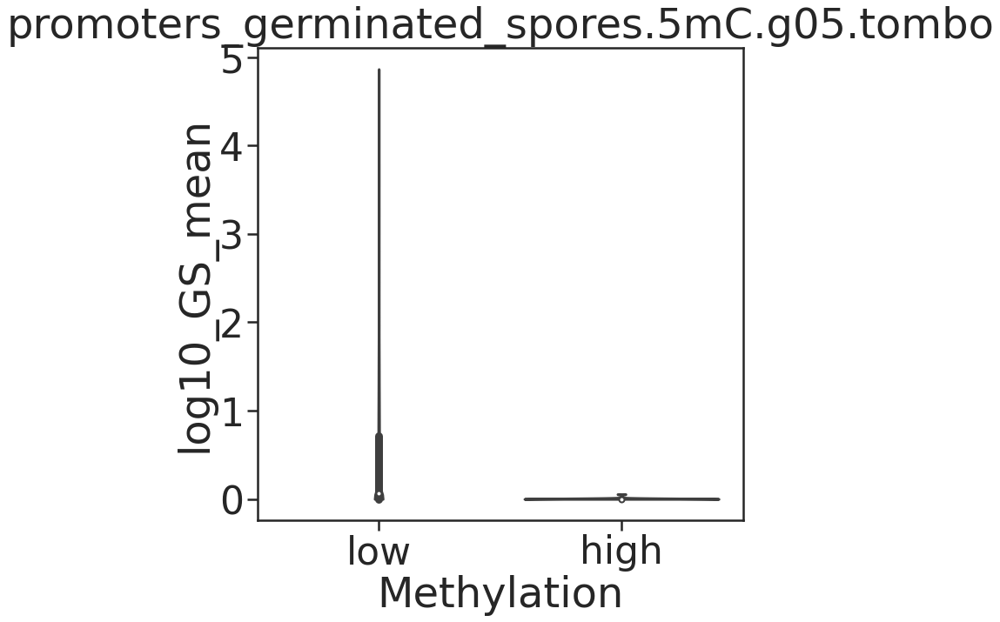

...

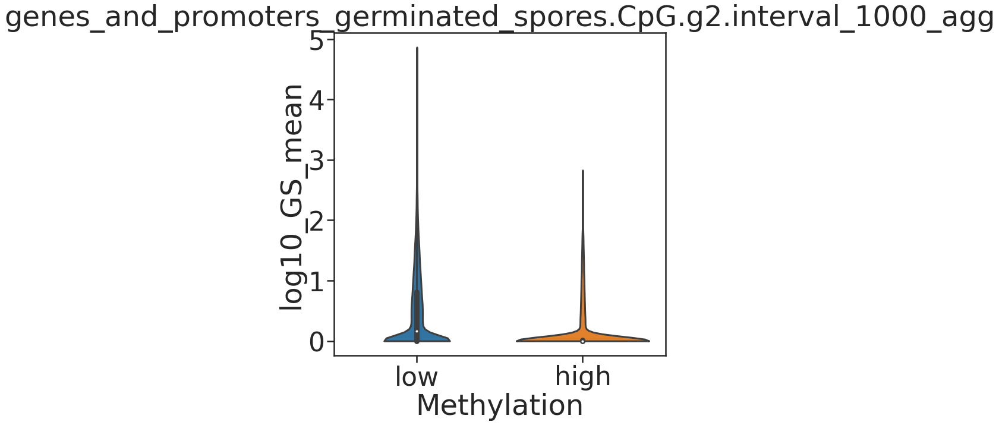

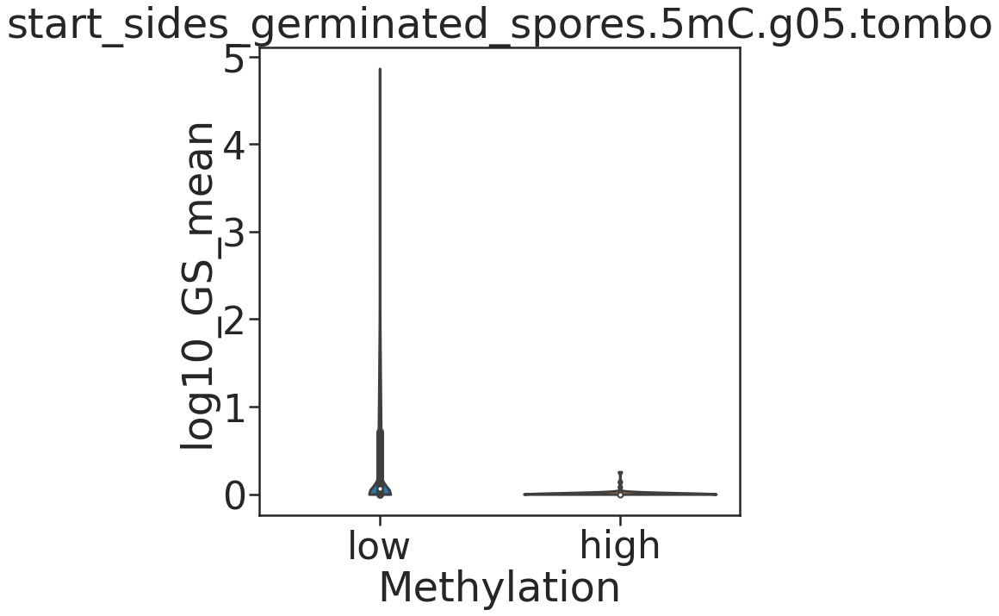

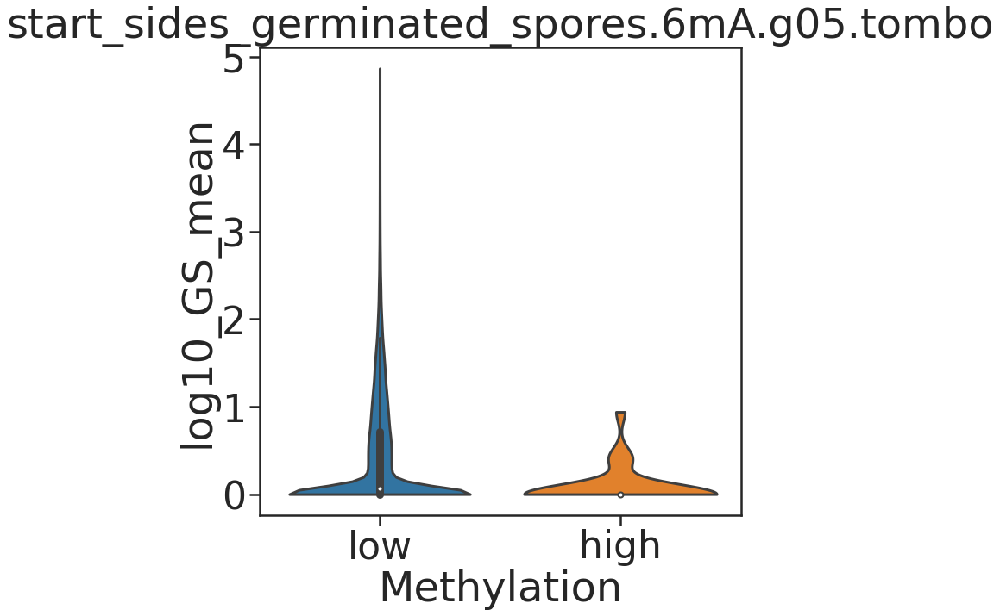

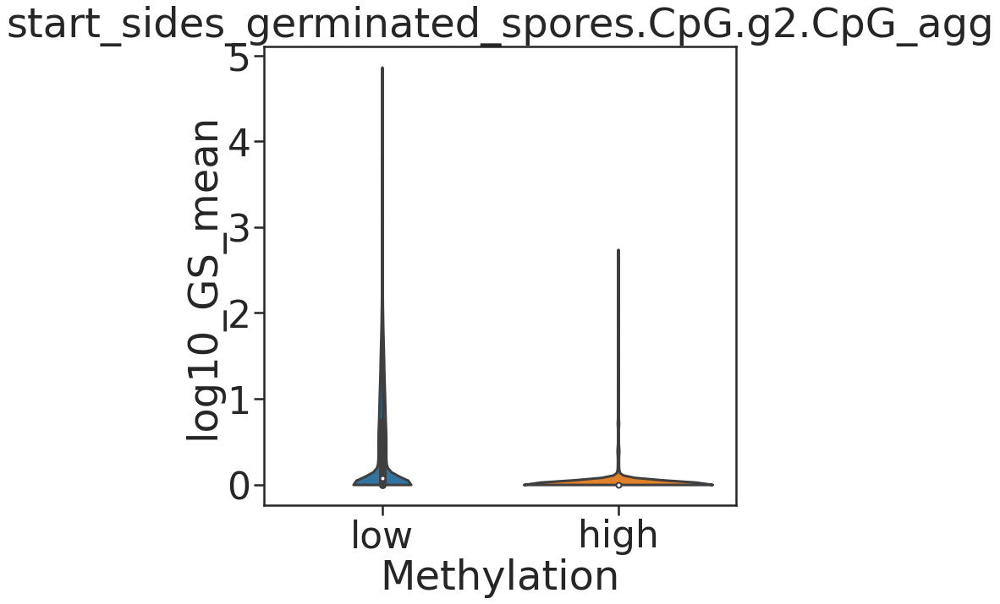

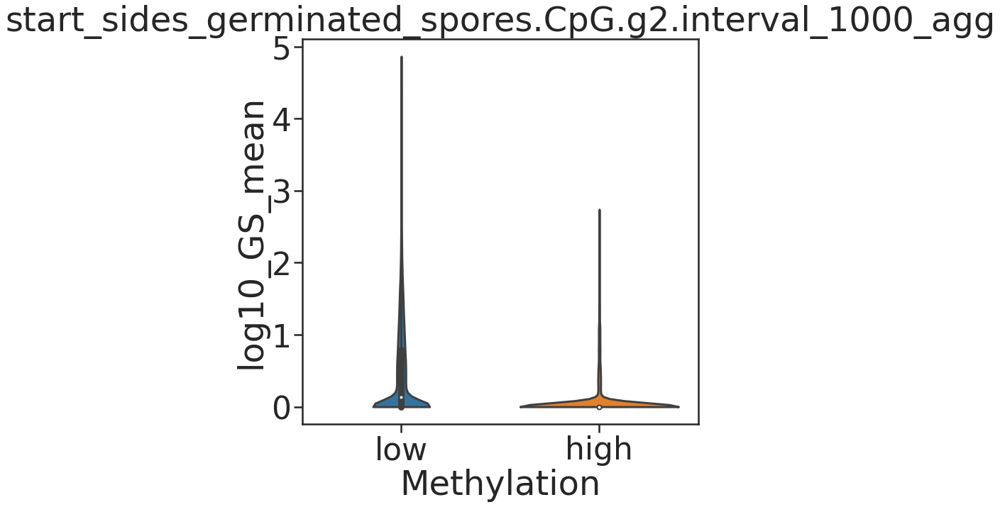

In [411]:
for x, y in zip( germinated_contidions, [expressions[0]]*len(germinated_contidions)):
    plot_boxplot_gene_expression(x,y,0.1)

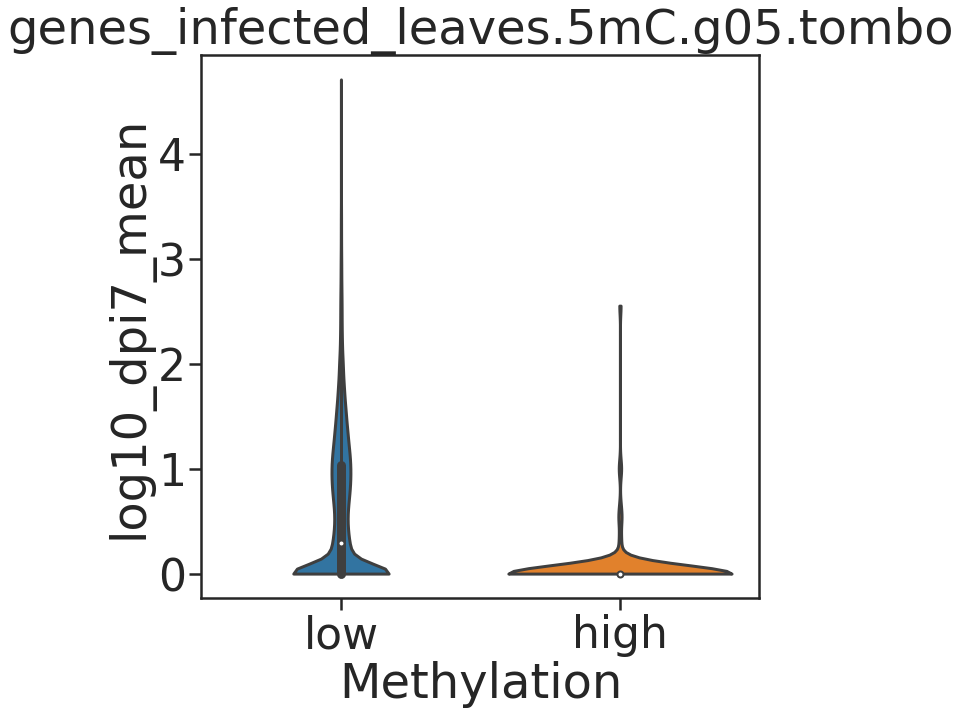

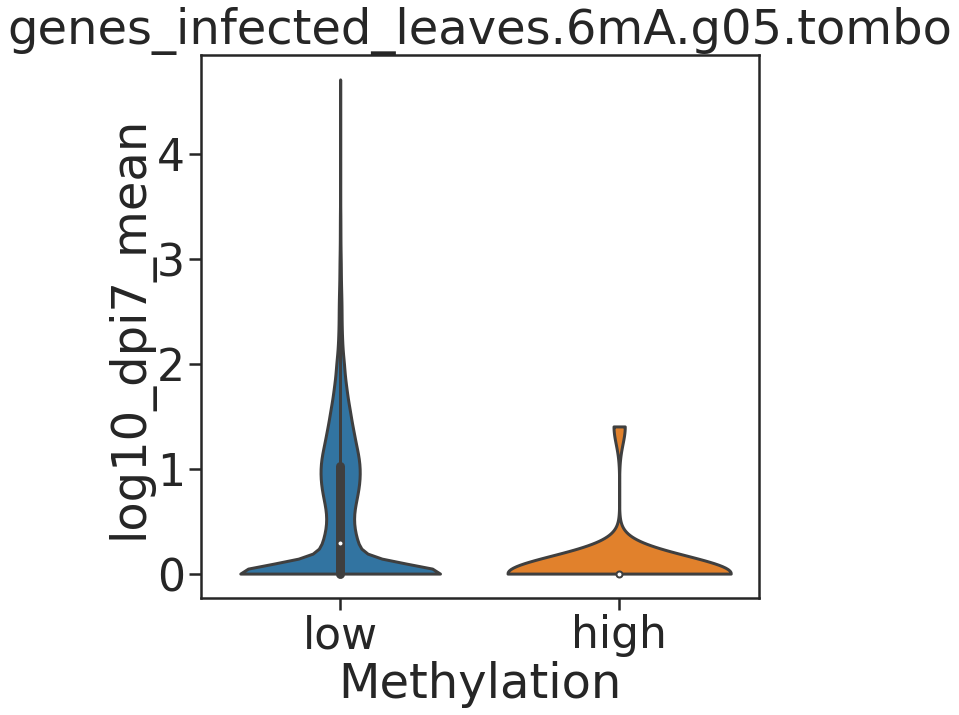

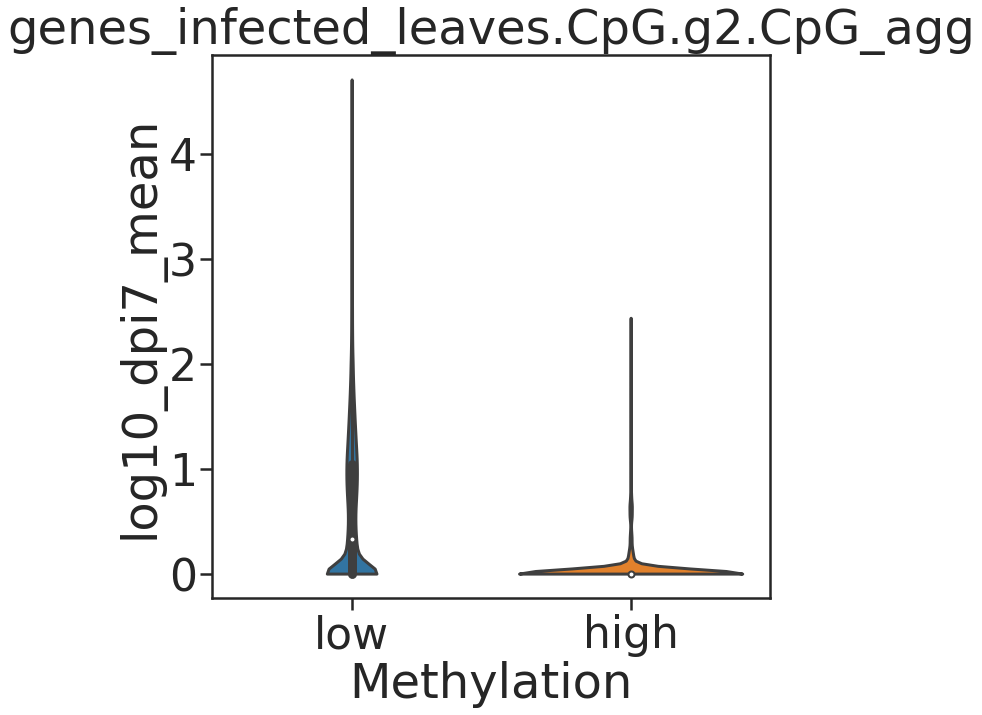

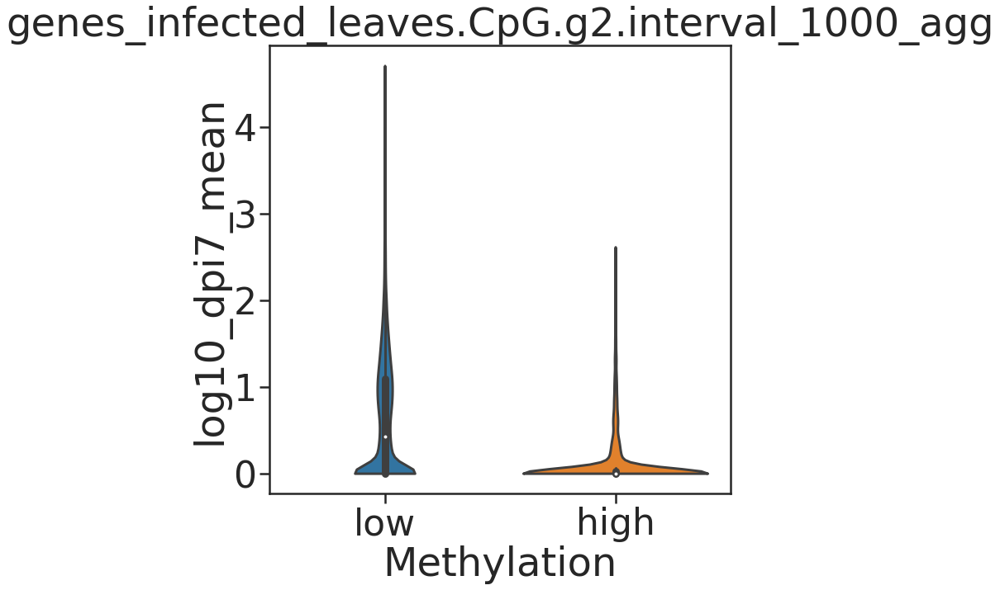

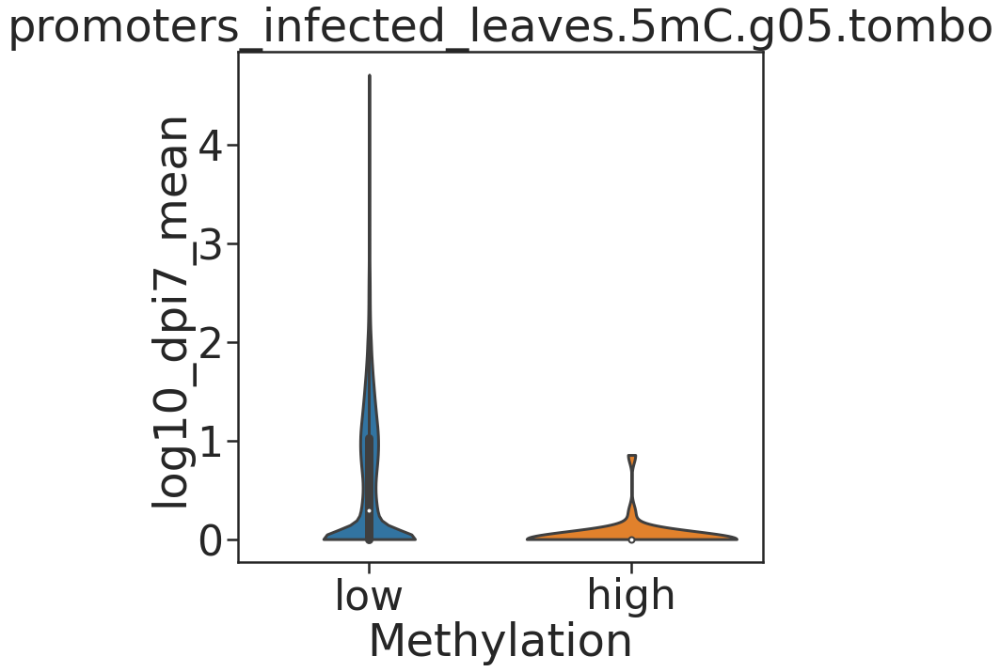

...

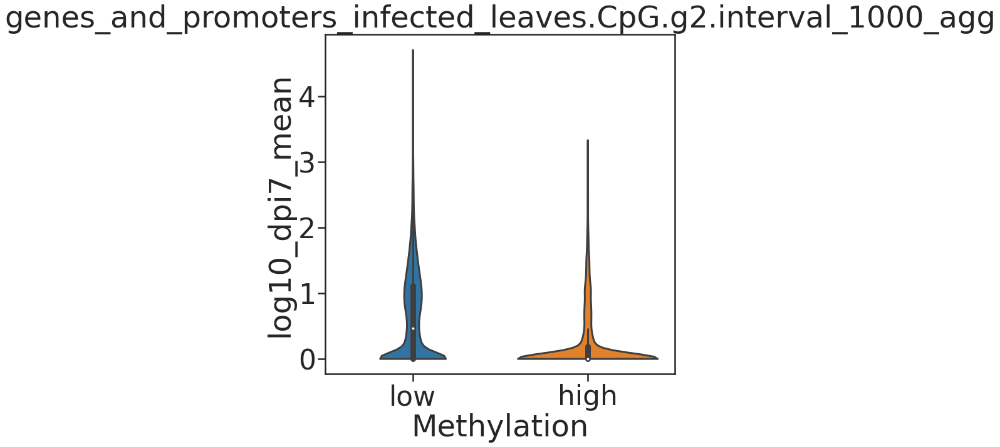

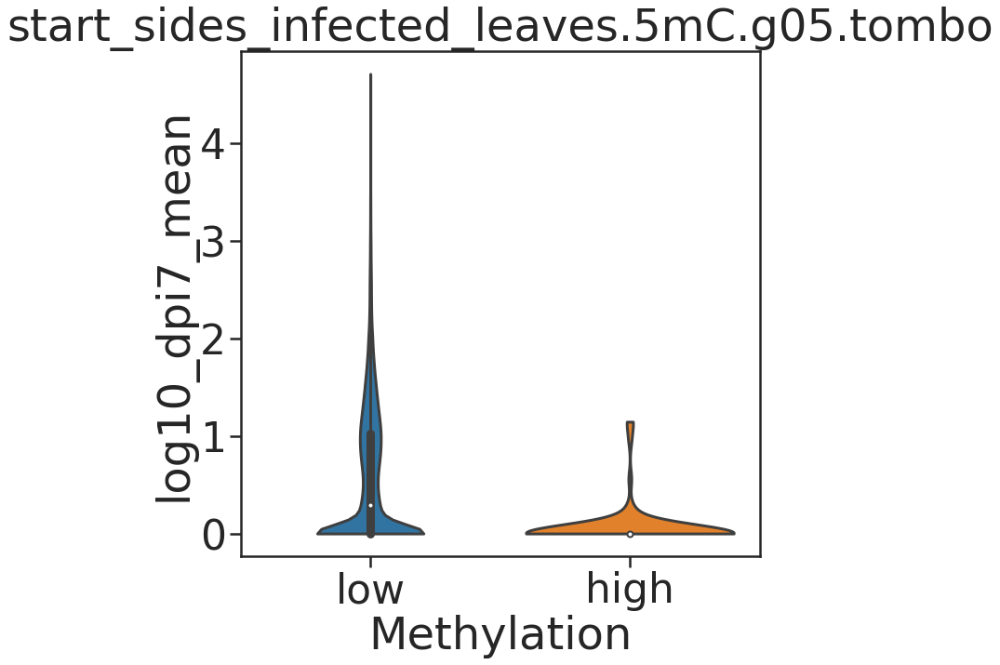

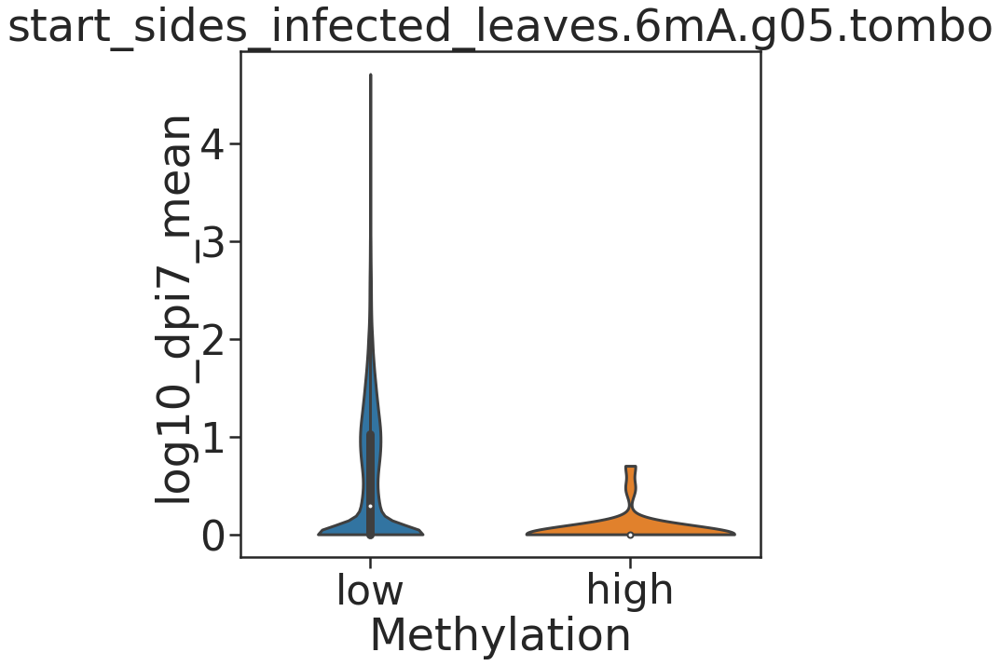

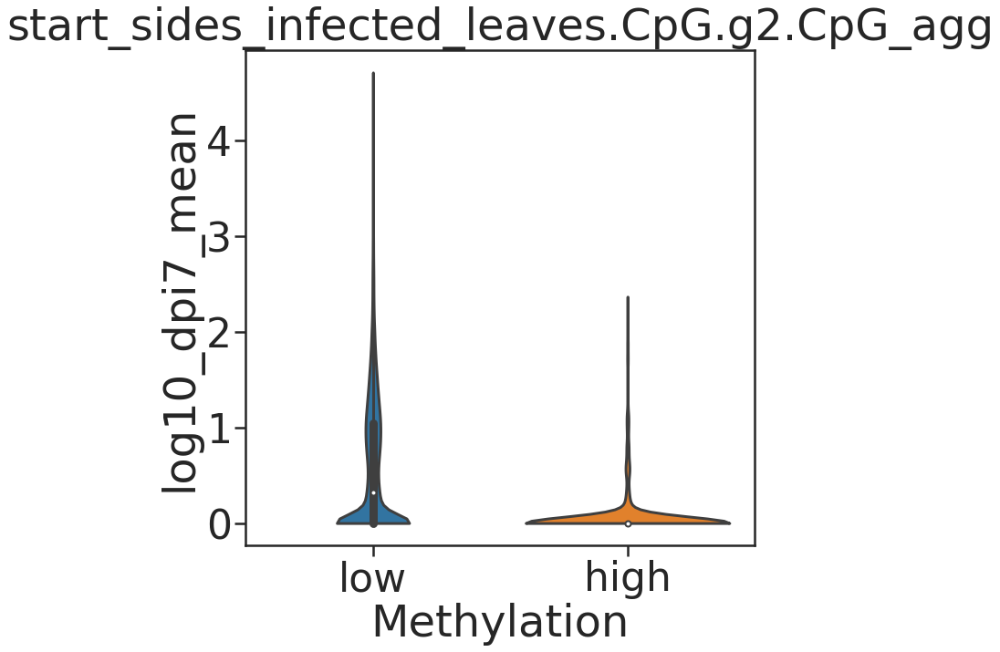

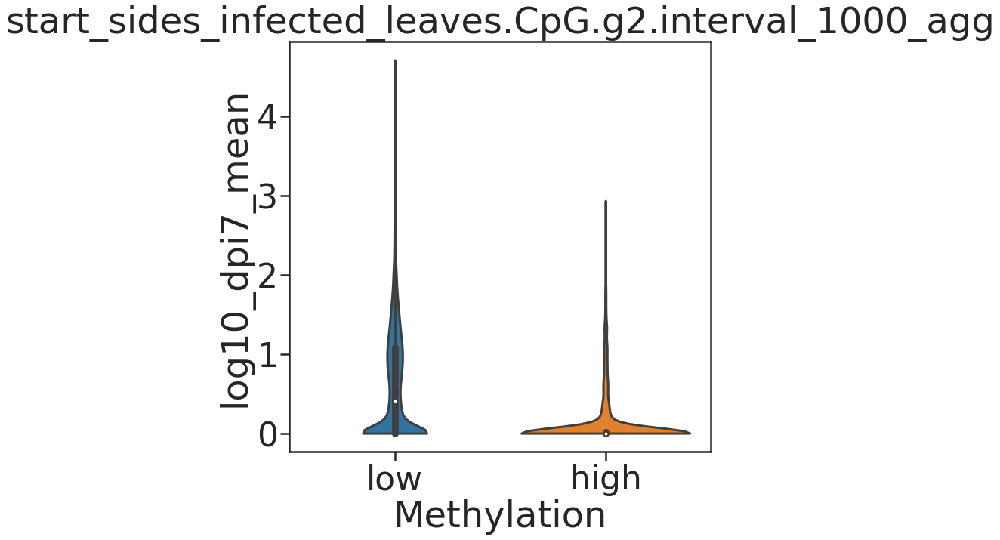

In [412]:
for x, y in zip( infected_contidions, [expressions[2]]*len(infected_contidions)):
    plot_boxplot_gene_expression(x,y,0.1)

In [413]:
def plot_boxplot_gene_expression_top(meth, express, cutoff):
    tmp_df = exp_short_df.copy()
    tmp_df.sort_values(meth, ascending=False, inplace=True)
    tmp_df['Methylation'] = "low"
    index = tmp_df.index[:cutoff]
    tmp_df.loc[index,'Methylation'] = 'high'
    fig , ax = plt.subplots(figsize=(10,10))
    sns.violinplot(x='Methylation', y=express, data=tmp_df, ax=ax, cut=0, order = ['low', 'high'])
    plt.title(meth)
    out_fn = os.path.join(outdir, 'top_' + str(cutoff) + '_methylated'+meth + '.png')
    fig.savefig(out_fn, bbox_inches='tight', dpi=600)
    return fig

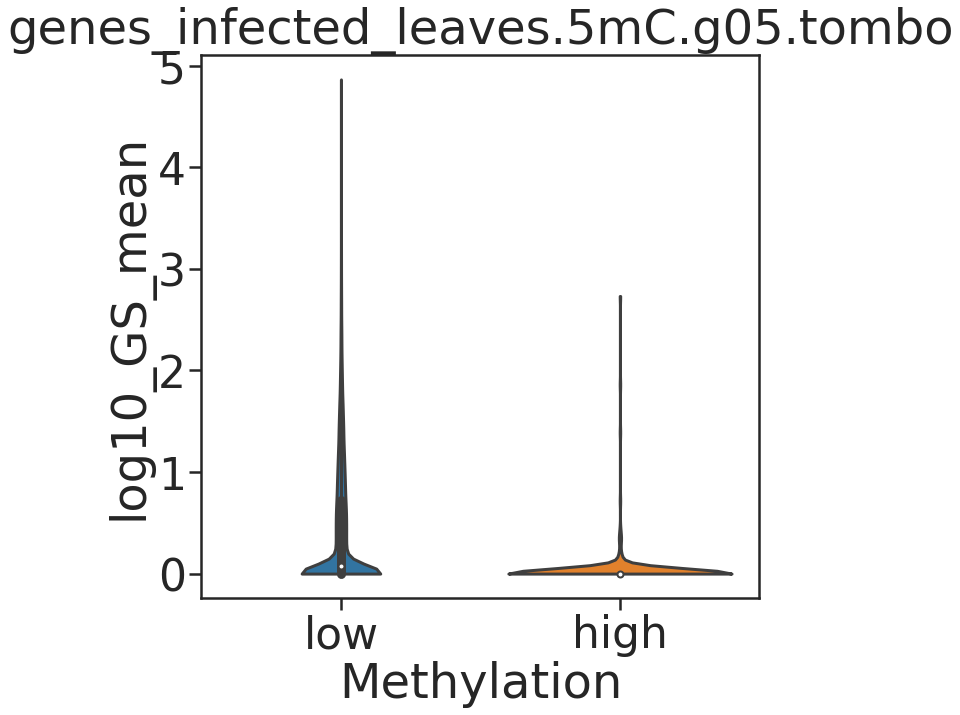

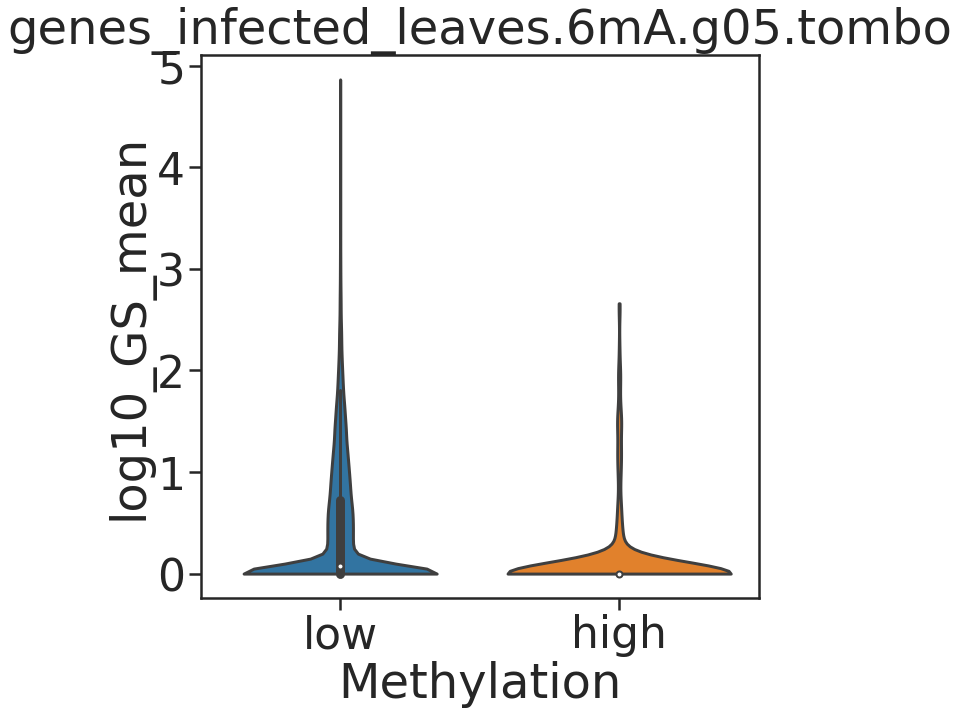

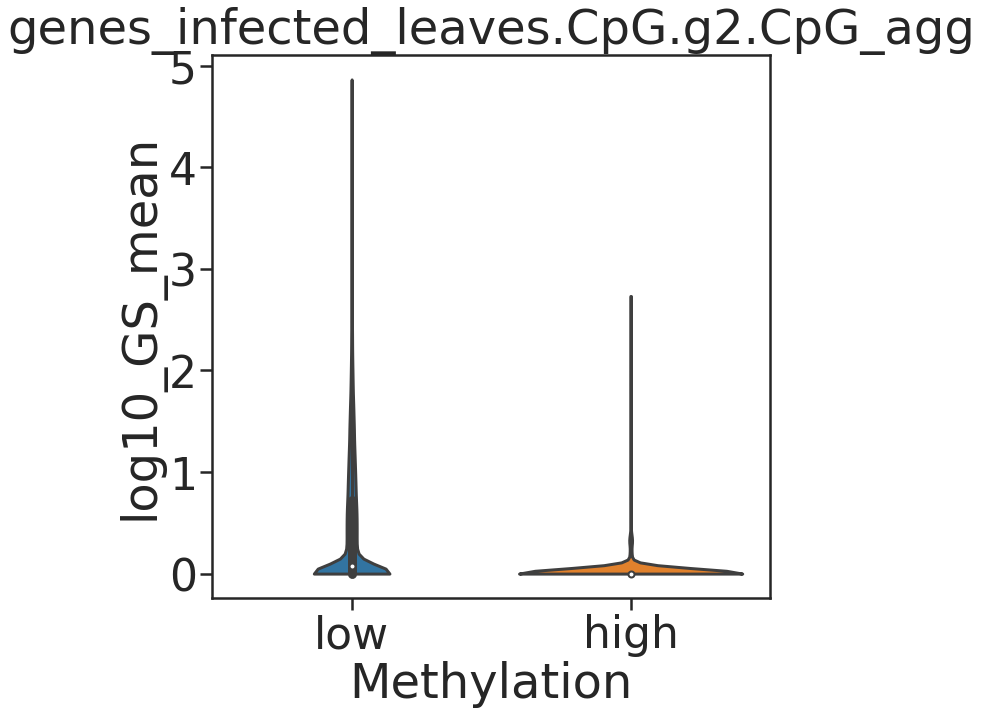

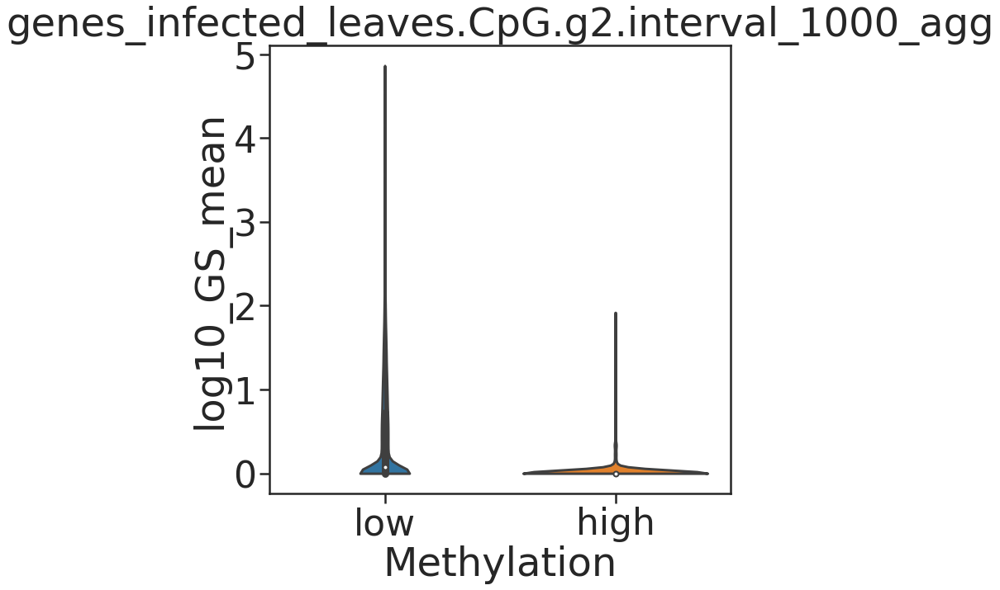

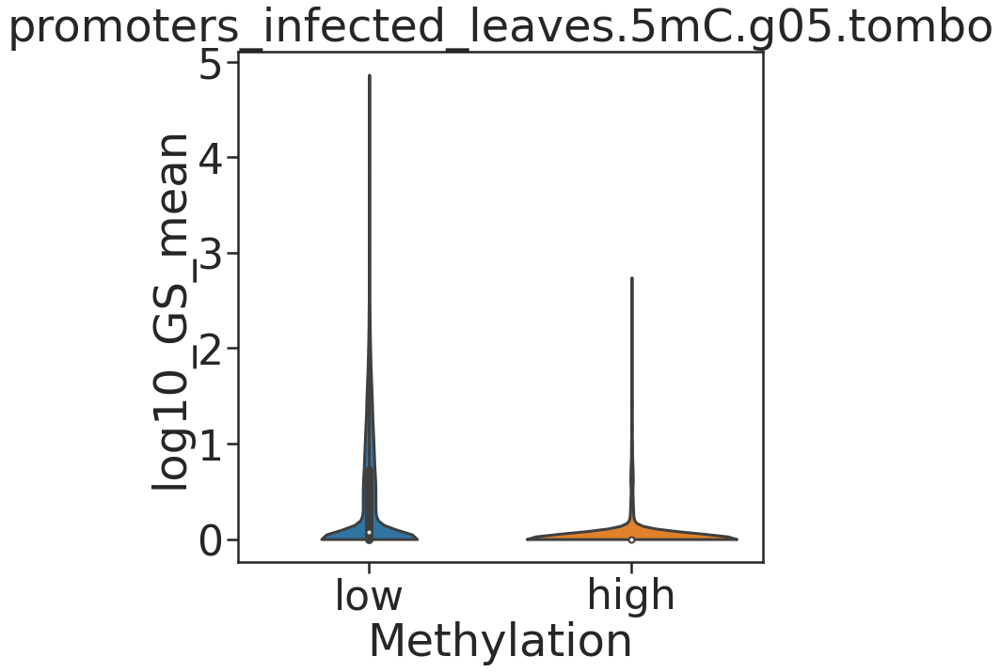

...

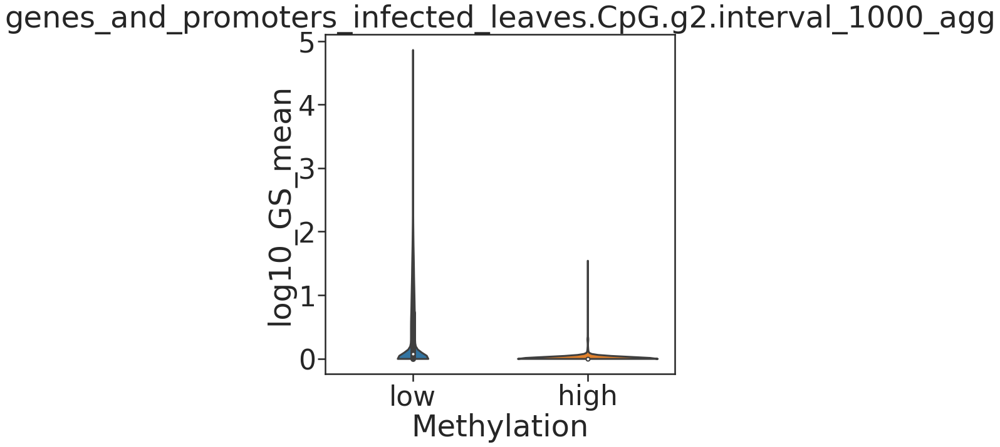

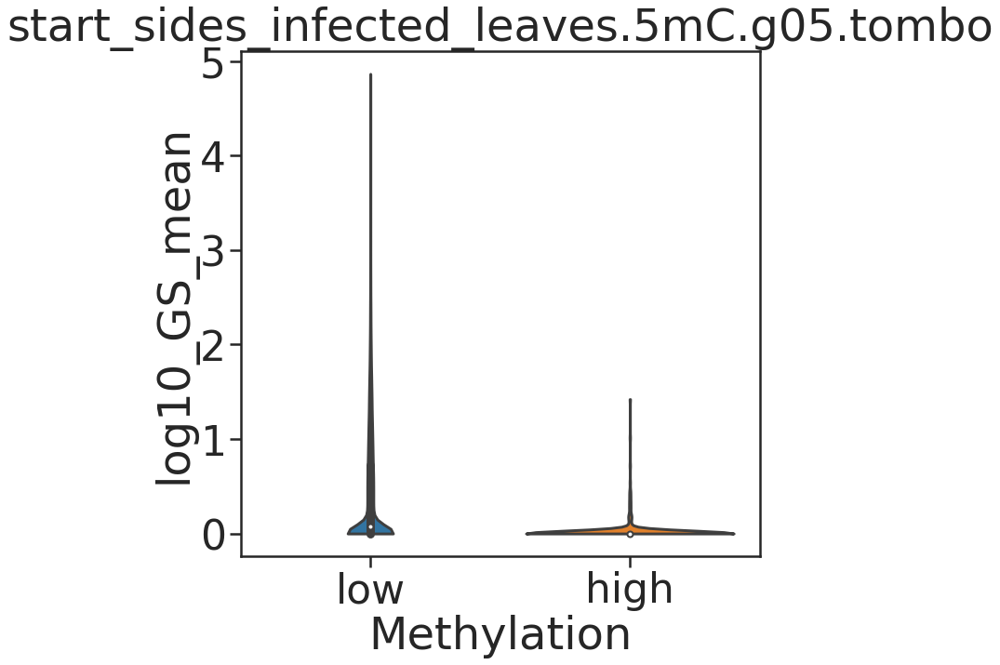

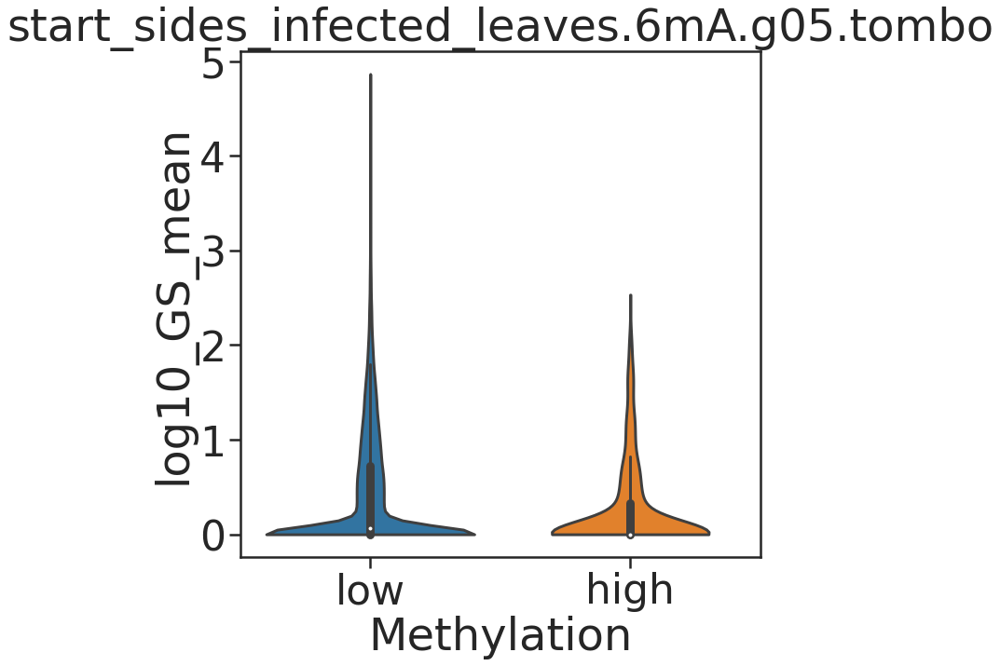

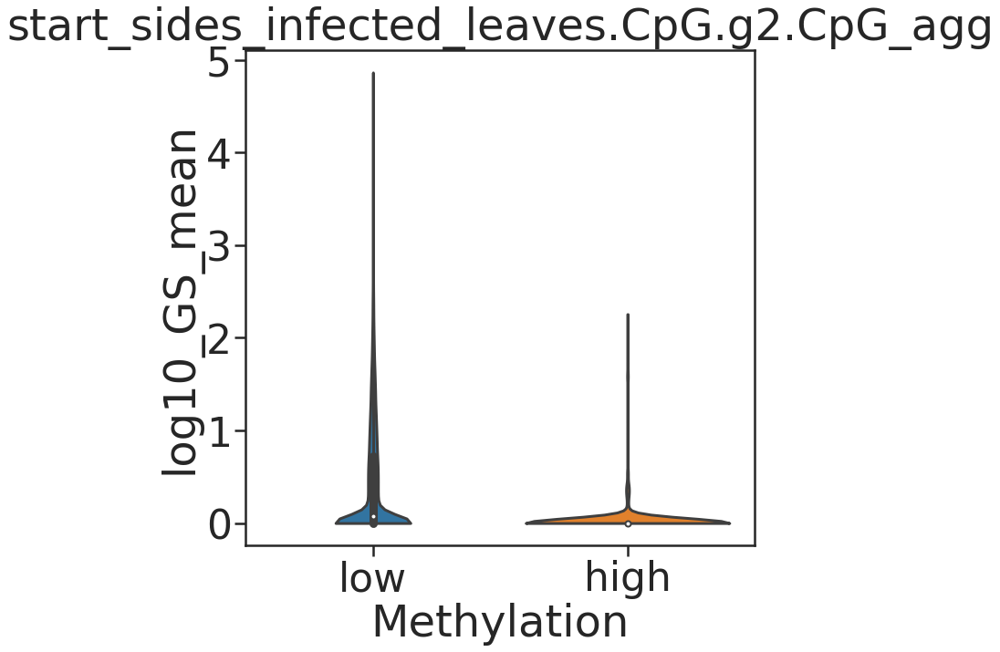

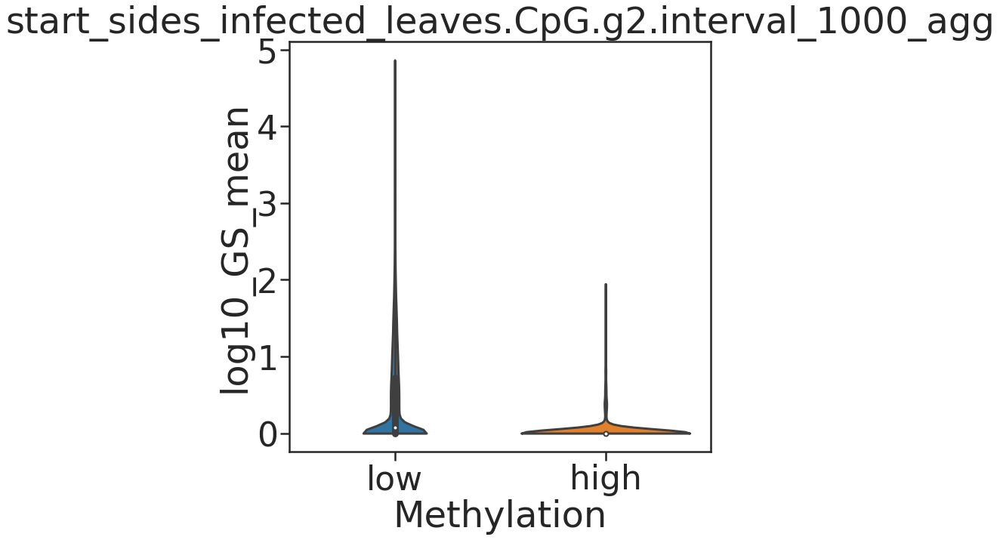

In [414]:
for x, y in zip( infected_contidions, [expressions[0]]*len(infected_contidions)):
    plot_boxplot_gene_expression_top(x,y,500)

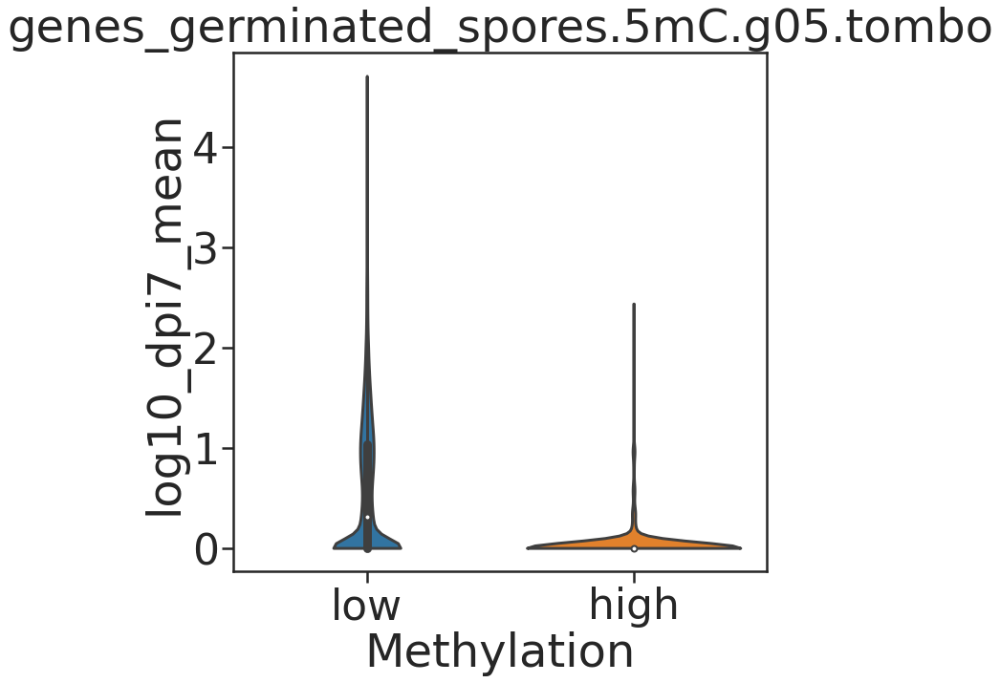

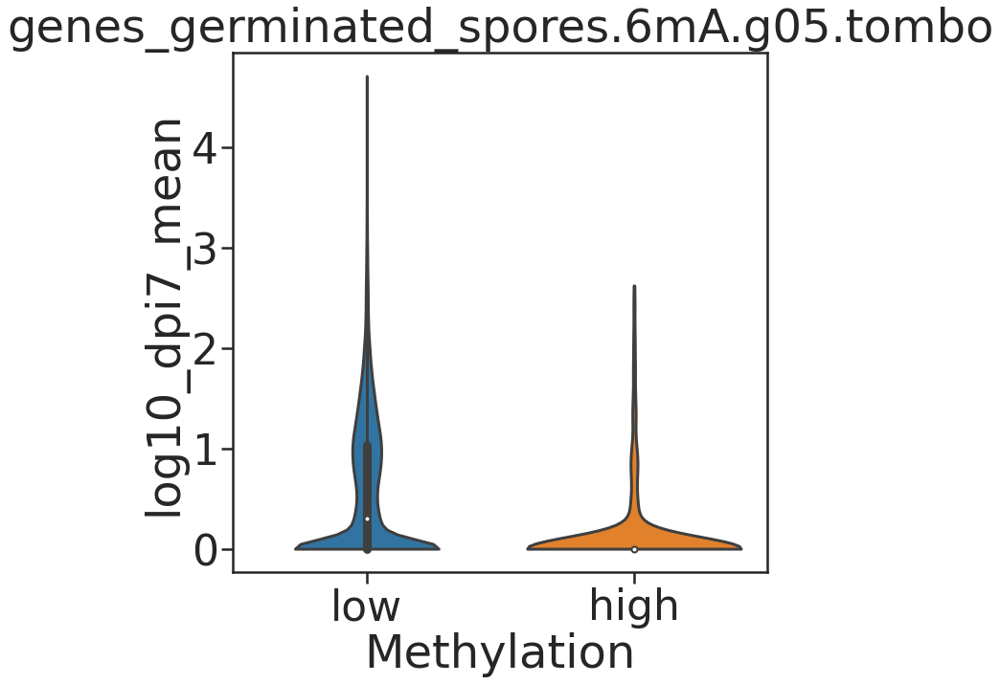

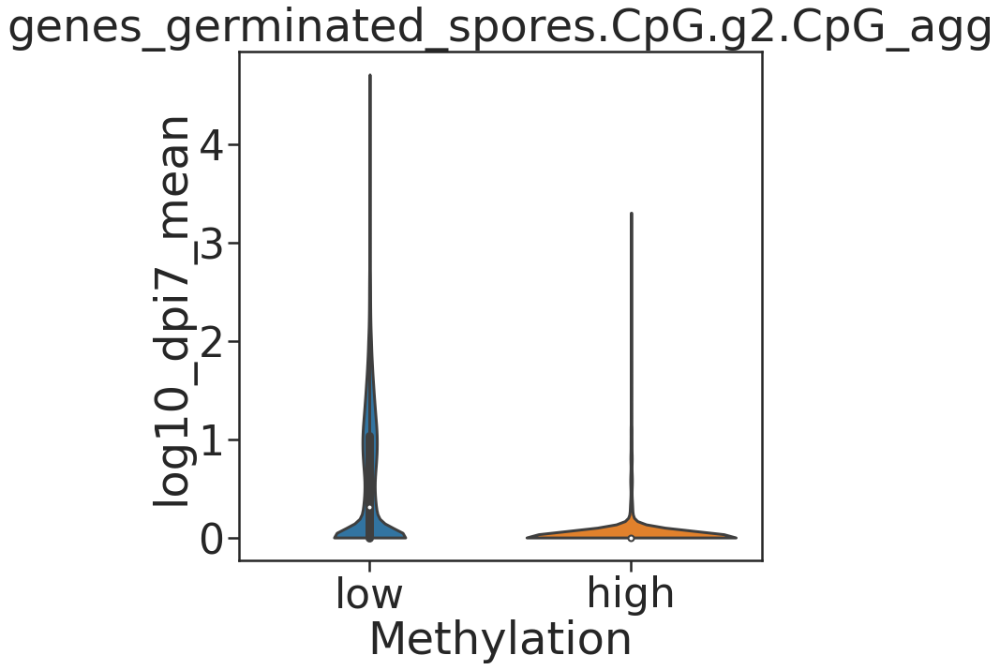

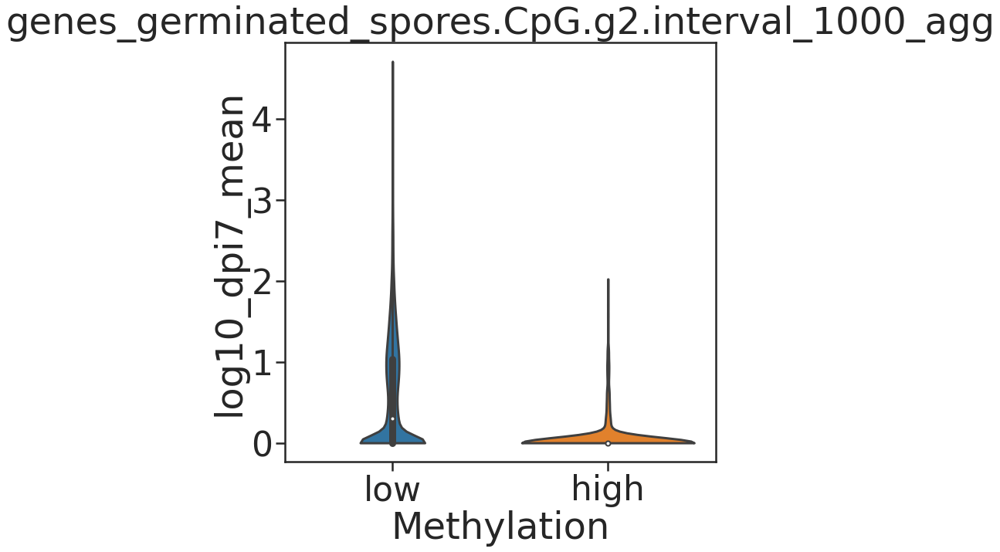

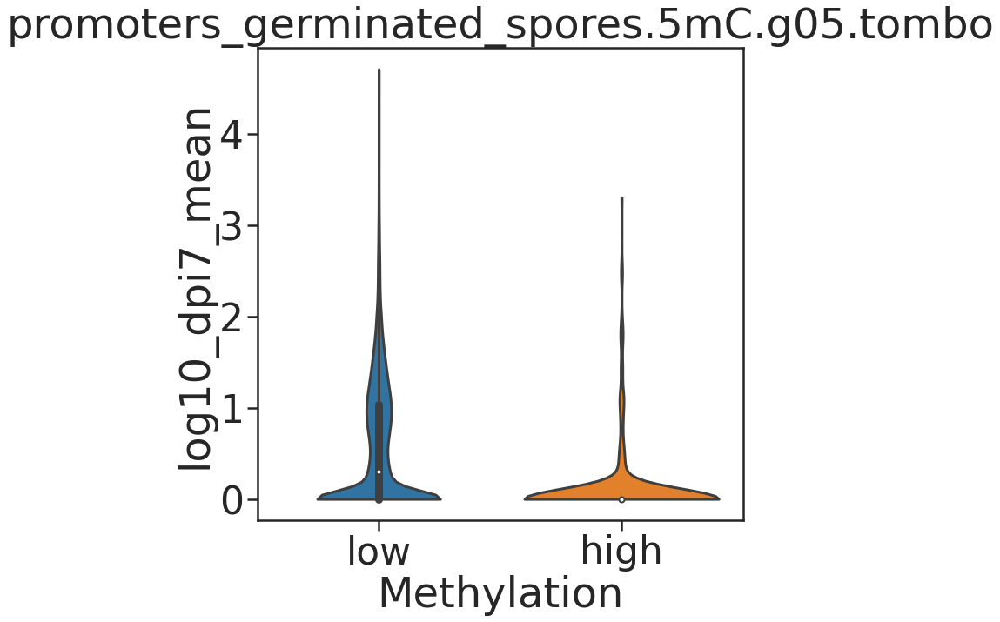

...

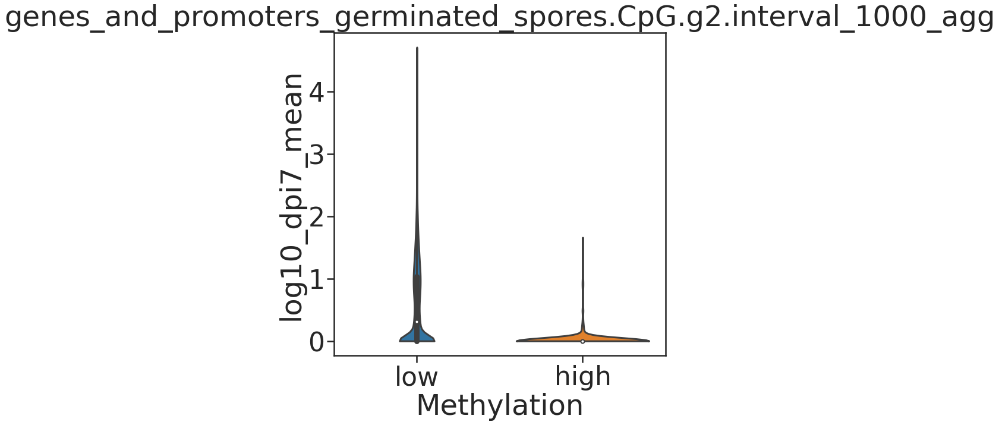

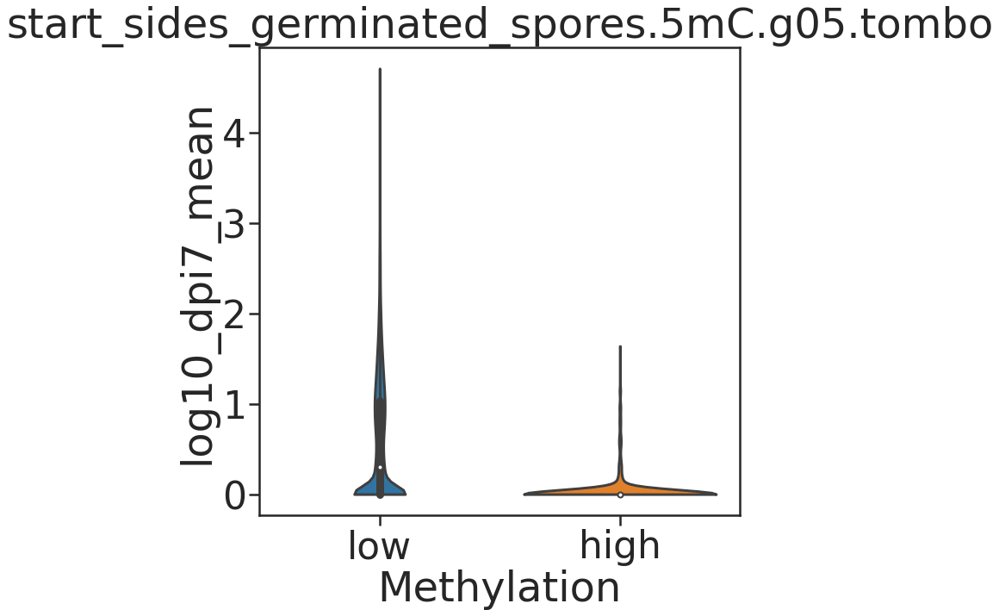

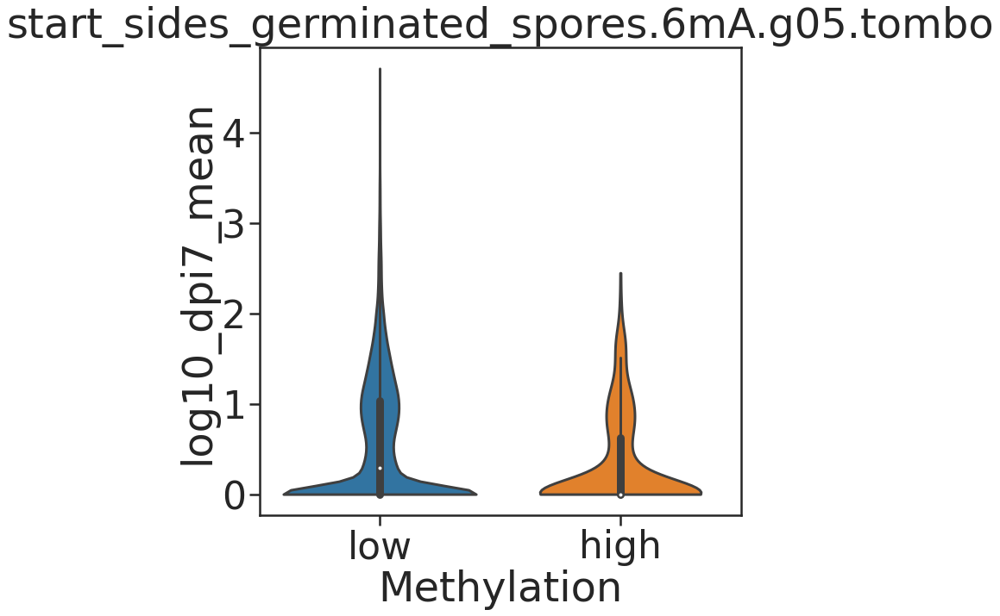

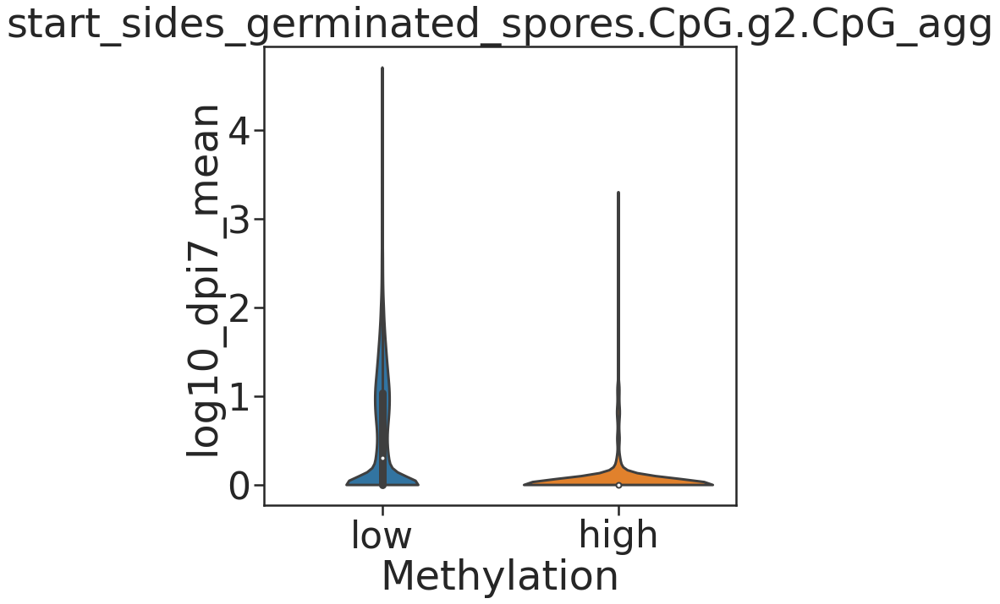

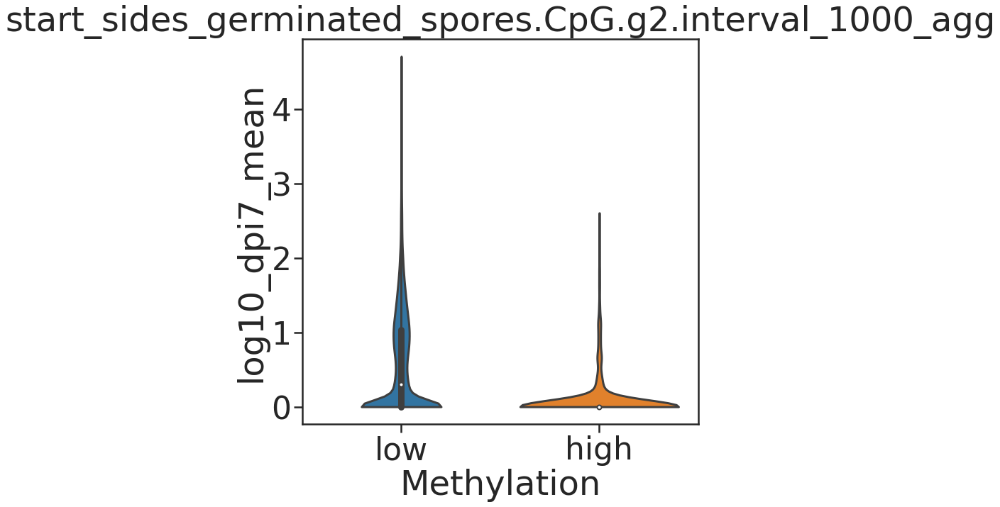

In [415]:
for x, y in zip( germinated_contidions, [expressions[2]]*len(germinated_contidions)):
    plot_boxplot_gene_expression_top(x,y,500)

In [418]:
Image('/home/jamila/jamila_Storage/analyses/methylation_analysis/gene_expression/genes_and_promoters_germinated_spores.5mC.g05.tombo.png')

In [417]:
outdir

'/home/jamila/jamila_Storage/analyses/methylation_analysis/gene_expression'

In [416]:
!ls {outdir}

Centromer_5mC.png
Centromer_5mC.tombo.png
Centromer_6mA.tombo.png
Correlation_matrix_5mA_and_6mC.png
genes_and_promoters_germinated_spores.5mC.g05.tombo.png
genes_and_promoters_germinated_spores.6mA.g05.tombo.png
genes_and_promoters_germinated_spores.CpG.g2.CpG_agg.png
genes_and_promoters_germinated_spores.CpG.g2.interval_1000_agg.png
genes_and_promoters_infected_leaves.5mC.g05.tombo.png
genes_and_promoters_infected_leaves.6mA.g05.tombo.png
genes_and_promoters_infected_leaves.CpG.g2.CpG_agg.png
genes_and_promoters_infected_leaves.CpG.g2.interval_1000_agg.png
genes_germinated_spores.5mC.g05.tombo.png
genes_germinated_spores.6mA.g05.tombo.png
genes_germinated_spores.CpG.g2.CpG_agg.png
genes_germinated_spores.CpG.g2.interval_1000_agg.png
genes_infected_leaves.5mC.g05.tombo.png
genes_infected_leaves.6mA.g05.tombo.png
genes_infected_leaves.CpG.g2.CpG_agg.png
genes_infected_leaves.CpG.g2.interval_1000_agg.png
promoters_germinated_spores.5mC.g05.tombo.png
promoters_germinated_spores.6mA.g05.t

In [258]:
annotation_bed_dict.keys()

dict_keys(['genes', 'TE_family', 'TE_superfamily', 'gene_starts', 'centromers'])

In [247]:
meth_bed_dict.keys()

dict_keys(['differential_il_vs_gp.CpG.p0_05.CpG_agg', 'differential_il_vs_gp.CpG.p0_05.interval_1000_agg', 'germinated_spores.5mC.g05.tombo', 'germinated_spores.6mA.g05.tombo', 'germinated_spores.CpG.g2.CpG_agg', 'germinated_spores.CpG.g2.interval_1000_agg', 'infected_leaves.5mC.g05.tombo', 'infected_leaves.6mA.g05.tombo', 'infected_leaves.CpG.g2.CpG_agg', 'infected_leaves.CpG.g2.interval_1000_agg', 'Pgt210_ABu.centromers'])

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/infected_leaves.5mC.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	13853	13854	5mC	0.5	-

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/infected_leaves.5mC.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	13853	13854	5mC	0.5	-



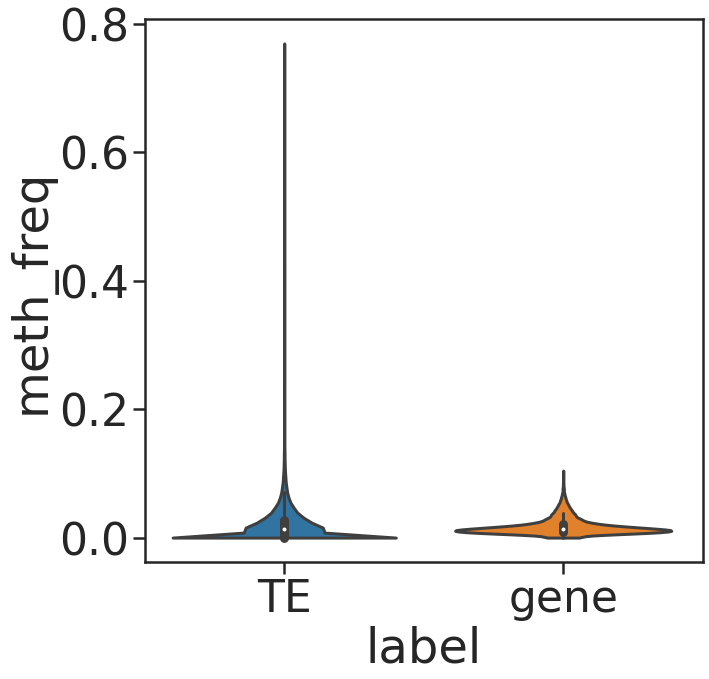

In [385]:
condition = 'infected_leaves.5mC.g05.tombo'
gene_region = 'genes_and_promoters'
TE_methylation= annotation_bed_dict['TE_superfamily'].coverage(meth_bed_dict[condition]).to_dataframe().loc[:, ['name', 'blockCount']]
TE_methylation.rename(columns={'blockCount' :'meth_freq'}, inplace=True)
label1 = pd.Series(['TE'] * len(TE_methylation.meth_freq), name='label')
tmp_df1 = pd.concat([label1, TE_methylation.meth_freq], axis=1)
gene_condition = gene_region +'_' +condition
label2 = pd.Series(['gene'] * len(exp_short_df[gene_condition]), name='label')
series = exp_short_df[gene_condition]
series.reset_index(drop=True, inplace=True)
series.rename('meth_freq', inplace=True)
tmp_df2 = pd.concat([label2, series], axis=1)
tmp_df3 = pd.concat([tmp_df1,tmp_df2])
fig , ax = plt.subplots(figsize=(10,10))
sns.violinplot(x= 'label', y='meth_freq', data = tmp_df3, cut = 0, ax=ax)

In [223]:
exp_short_df["1kb_TE_close"] = False
ids = pd.read_csv(os.path.join(beddir, 'Puccinia_graminis_tritici_21-0.gene_wTE_1kb.sorted.bed'), sep='\t', header=None)[3].tolist()
exp_short_df.loc[ids, "1kb_TE_close"] = True

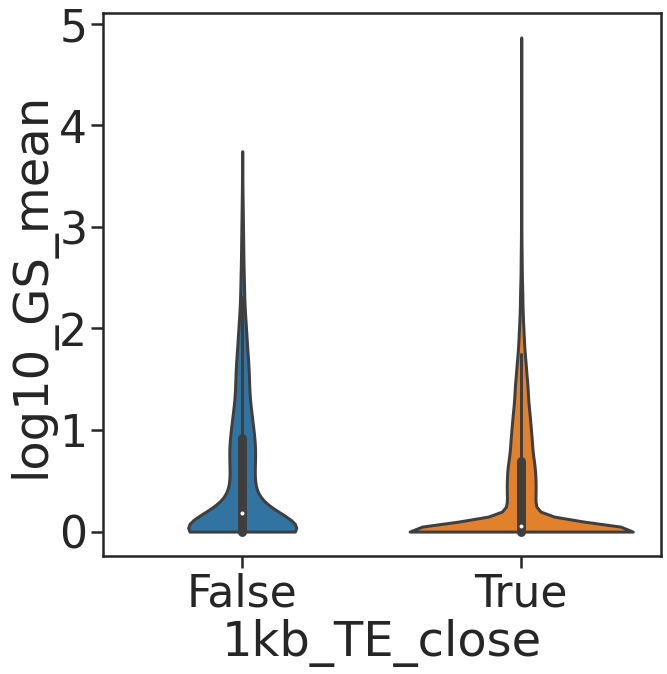

In [419]:
fig , ax = plt.subplots(figsize=(10,10))
sns.violinplot(x= '1kb_TE_close', y='log10_GS_mean', data = exp_short_df, cut = 0, ax=ax)
out_fn = os.path.join(outdir, 'TE_neighbourhood_vs_expression.GS.png')
fig.savefig(out_fn, bbox_inches='tight', dpi=600)

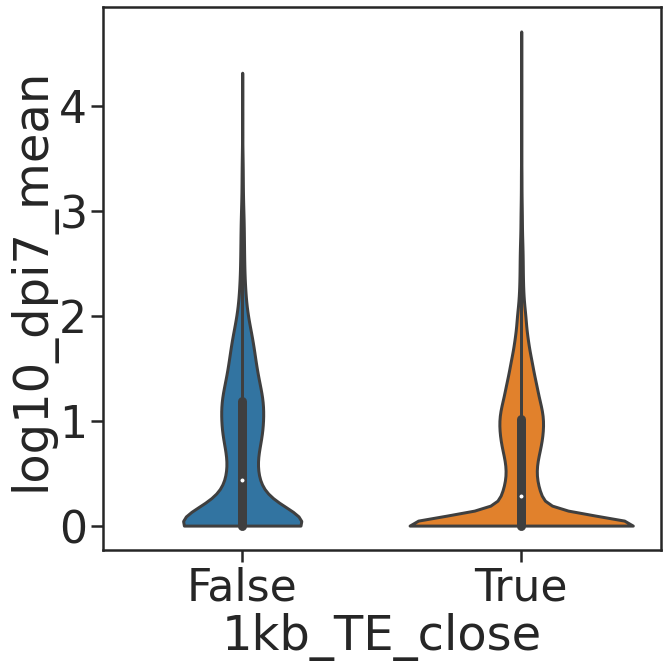

In [420]:
fig , ax = plt.subplots(figsize=(10,10))
sns.violinplot(x= '1kb_TE_close', y='log10_dpi7_mean', data = exp_short_df, cut = 0, ax=ax)
out_fn = os.path.join(outdir, 'TE_neighbourhood_vs_expression.IL.png')
fig.savefig(out_fn, bbox_inches='tight', dpi=600)

In [263]:
meth_bed_dict.keys()

dict_keys(['differential_il_vs_gp.CpG.p0_05.CpG_agg', 'differential_il_vs_gp.CpG.p0_05.interval_1000_agg', 'germinated_spores.5mC.g05.tombo', 'germinated_spores.6mA.g05.tombo', 'germinated_spores.CpG.g2.CpG_agg', 'germinated_spores.CpG.g2.interval_1000_agg', 'infected_leaves.5mC.g05.tombo', 'infected_leaves.6mA.g05.tombo', 'infected_leaves.CpG.g2.CpG_agg', 'infected_leaves.CpG.g2.interval_1000_agg', 'Pgt210_ABu.centromers'])

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/infected_leaves.5mC.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	13853	13854	5mC	0.5	-

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/infected_leaves.5mC.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	13853	13854	5mC	0.5	-



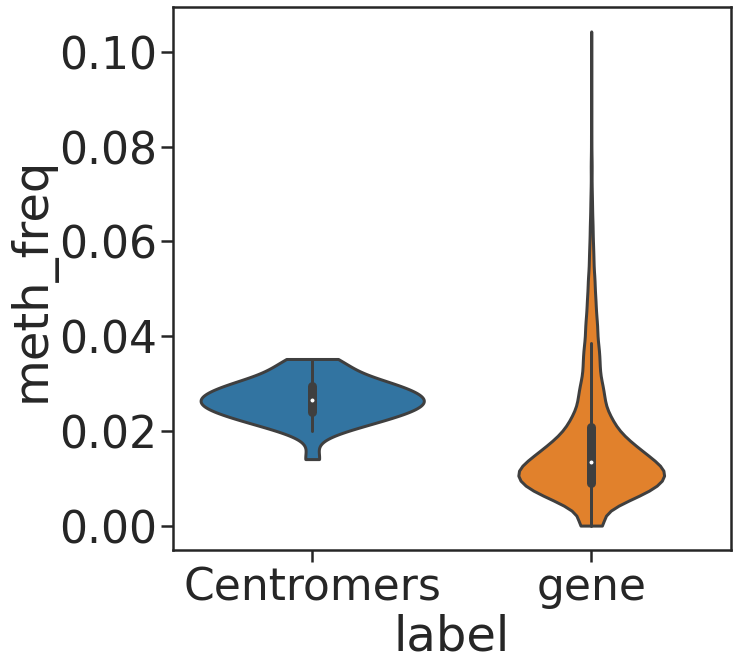

In [387]:
condition = 'infected_leaves.5mC.g05.tombo'
gene_region = 'genes_and_promoters'
TE_methylation= annotation_bed_dict['centromers'].coverage(meth_bed_dict[condition]).to_dataframe().loc[:, ['name', 'blockCount']]
TE_methylation.rename(columns={'blockCount' :'meth_freq'}, inplace=True)
label1 = pd.Series(['Centromers'] * len(TE_methylation.meth_freq), name='label')
tmp_df1 = pd.concat([label1, TE_methylation.meth_freq], axis=1)
gene_condition = gene_region +'_' +condition
label2 = pd.Series(['gene'] * len(exp_short_df[gene_condition]), name='label')
series = exp_short_df[gene_condition]
series.reset_index(drop=True, inplace=True)
series.rename('meth_freq', inplace=True)
tmp_df2 = pd.concat([label2, series], axis=1)
tmp_df3 = pd.concat([tmp_df1,tmp_df2])
fig , ax = plt.subplots(figsize=(10,10))
sns.violinplot(x= 'label', y='meth_freq', data = tmp_df3, cut = 0, ax=ax)
out_fn = os.path.join(outdir, 'Centromer_5mC.tombo.png')
plt.savefig(out_fn, dpi=600)

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/infected_leaves.6mA.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	13373	13374	6mA	0.5	-

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/infected_leaves.6mA.g05.tombo.sorted.bed has inconsistent naming convention for record:
tig00000006	13373	13374	6mA	0.5	-



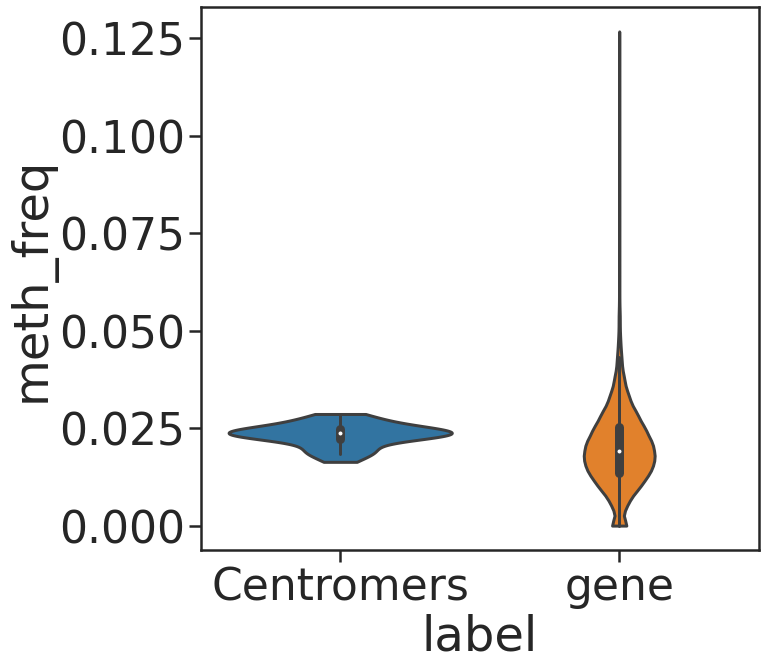

In [386]:
condition = 'infected_leaves.6mA.g05.tombo'
gene_region = 'genes_and_promoters'
TE_methylation= annotation_bed_dict['centromers'].coverage(meth_bed_dict[condition]).to_dataframe().loc[:, ['name', 'blockCount']]
TE_methylation.rename(columns={'blockCount' :'meth_freq'}, inplace=True)
label1 = pd.Series(['Centromers'] * len(TE_methylation.meth_freq), name='label')
tmp_df1 = pd.concat([label1, TE_methylation.meth_freq], axis=1)
gene_condition = gene_region +'_' +condition
label2 = pd.Series(['gene'] * len(exp_short_df[gene_condition]), name='label')
series = exp_short_df[gene_condition]
series.reset_index(drop=True, inplace=True)
series.rename('meth_freq', inplace=True)
tmp_df2 = pd.concat([label2, series], axis=1)
tmp_df3 = pd.concat([tmp_df1,tmp_df2])
fig , ax = plt.subplots(figsize=(10,10))
sns.violinplot(x= 'label', y='meth_freq', data = tmp_df3, cut = 0, ax=ax)
out_fn = os.path.join(outdir, 'Centromer_6mA.tombo.png')
plt.savefig(out_fn, dpi=600)

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/infected_leaves.CpG.g2.interval_1000_agg.sorted.bed has inconsistent naming convention for record:
tig00000099	23000	24000	.	3.84	.	23000	24000	249,73,40

***** WARNING: File /home/jamila/jamila_Storage/analyses/methylation_analysis/bed_files/infected_leaves.CpG.g2.interval_1000_agg.sorted.bed has inconsistent naming convention for record:
tig00000099	23000	24000	.	3.84	.	23000	24000	249,73,40



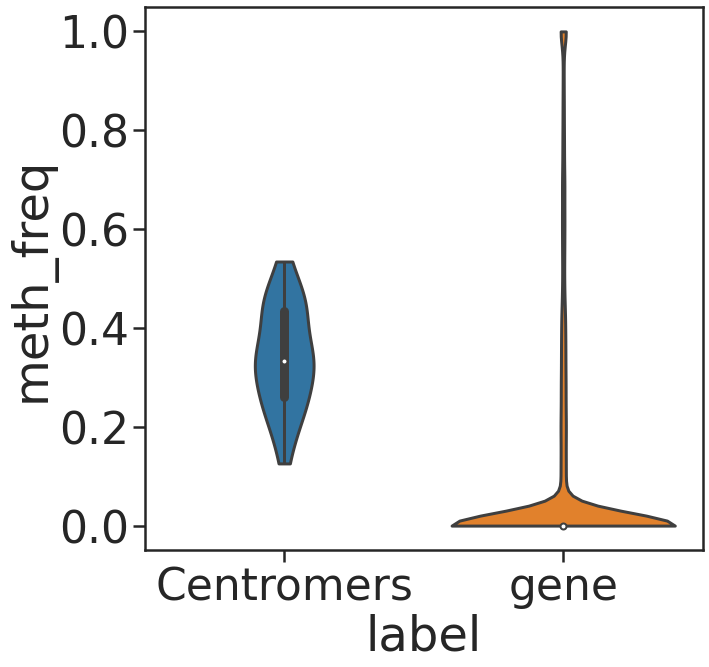

In [383]:
condition = 'infected_leaves.CpG.g2.interval_1000_agg'
gene_region = 'genes_and_promoters'
TE_methylation= annotation_bed_dict['centromers'].coverage(meth_bed_dict[condition]).to_dataframe().loc[:, ['name', 'blockCount']]
TE_methylation.rename(columns={'blockCount' :'meth_freq'}, inplace=True)
label1 = pd.Series(['Centromers'] * len(TE_methylation.meth_freq), name='label')
tmp_df1 = pd.concat([label1, TE_methylation.meth_freq], axis=1)
gene_condition = gene_region +'_' +condition
label2 = pd.Series(['gene'] * len(exp_short_df[gene_condition]), name='label')
series = exp_short_df[gene_condition]
series.reset_index(drop=True, inplace=True)
series.rename('meth_freq', inplace=True)
tmp_df2 = pd.concat([label2, series], axis=1)
tmp_df3 = pd.concat([tmp_df1,tmp_df2])
fig , ax = plt.subplots(figsize=(10,10))
sns.violinplot(x= 'label', y='meth_freq', data = tmp_df3, cut = 0, ax=ax)
out_fn = os.path.join(outdir, 'Centromer_5mC.png')
plt.savefig(out_fn, dpi=600)

In [238]:
def plot_boxplot_gene_expression_top_expressed(meth, express, cutoff):
    tmp_df = exp_short_df.copy()
    tmp_df.sort_values(express, ascending=False, inplace=True)
    tmp_df['expression'] = "low"
    index = tmp_df.index[:cutoff]
    tmp_df.loc[index,'expression'] = 'high'
    fig , ax = plt.subplots(figsize=(5,5))
    sns.violinplot(x='expression', y=meth, data=tmp_df, ax=ax, cut=0)
    plt.title(meth)
    return fig

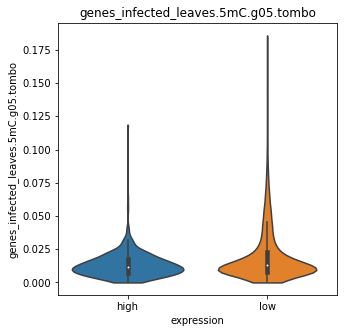

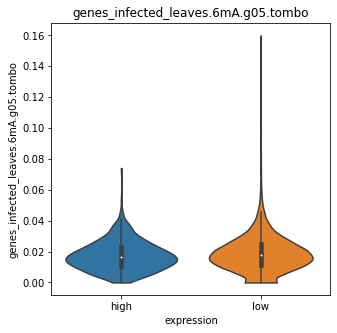

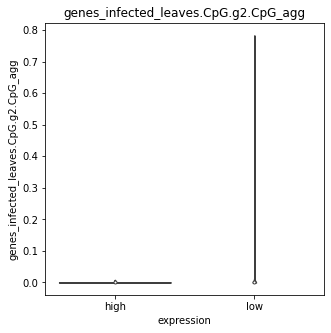

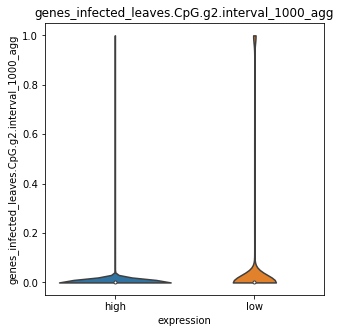

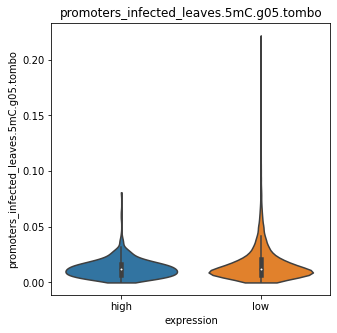

...

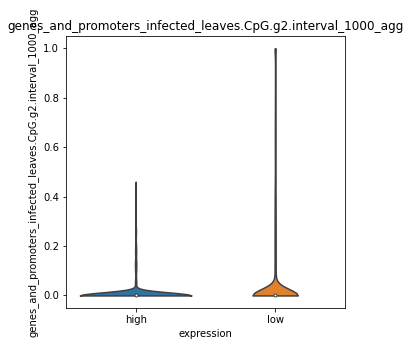

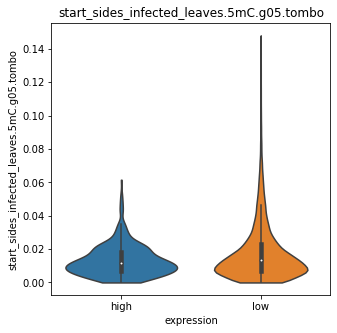

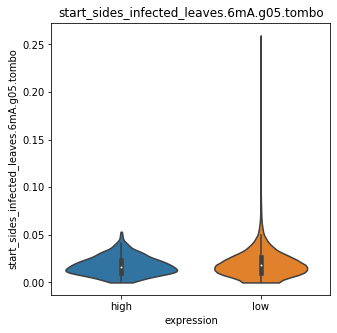

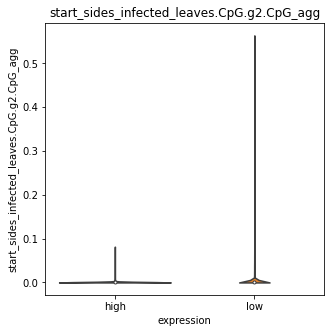

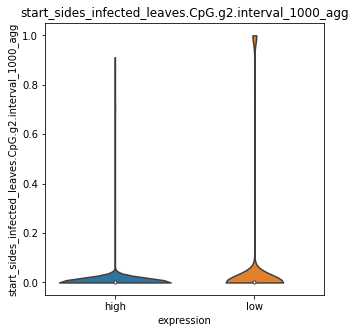

In [242]:
for x, y in zip( infected_contidions, [expressions[2]]*len(infected_contidions)):
    plot_boxplot_gene_expression_top_expressed(x,y,500)

### last think might be to look for differential expression in differential methylated regions based on tombo